# 8.1 Fashion classification
前面课程中的数据集，都是二维表格，原始数据都是csv格式；

我们通过，线性回归预测数值结果，比如预测车辆价格

我们通过，逻辑回归预测概率结果，比如预测用户流失

我们通过，决策树，随机森林，XGboost 这三个模型，能完成线性回归和逻辑回归的相关任务

我们理解了：

- rmse 的结果是衡量回归模型准确度的标准之一，决策树回归、随机森林回归、XGBoost回归等所有回归算法，都可以用RMSE来评估。（RMSE对异常值（离群点）非常敏感。如果数据中有几个极端错误的值，RMSE会变得很大。如果数据存在较多异常值，通常建议使用 MAE（平均绝对误差） 作为补充。）

- auc的结果是衡量二分类模型准确率的标准，衡量什么：模型把正样本排在负样本前面的能力。AUC=0.5等同于随机猜测，AUC=1.0表示完美区分。二分类（如判断用户是否点击广告、是否患病）、多分类（One-vs-Rest策略下计算平均AUC）。支持向量机（SVM）、XGBoost分类器、神经网络等所有输出概率或置信度的分类算法，都可以用AUC来评估。


## 本节课，我们将要使用不同的数据类型：***图像***
## 多类分类项目--multi-class classification，通过构建模型，能够识别出当前服装属于10个不同服装类别之一。
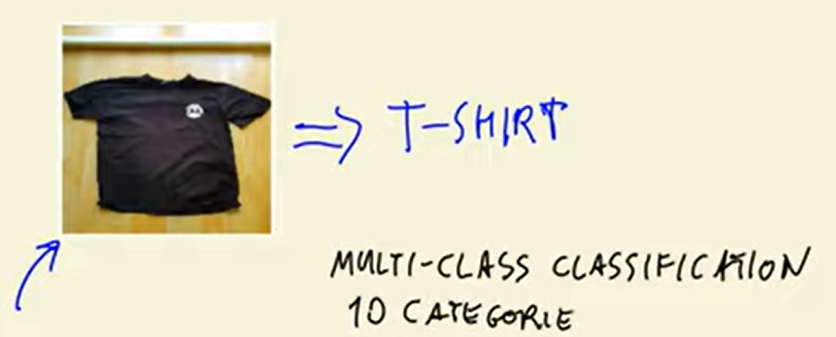

### 下图：用户上传衣服图片，时尚分类服务中包含一个神经网络模型，为用户提供图像识别的功能
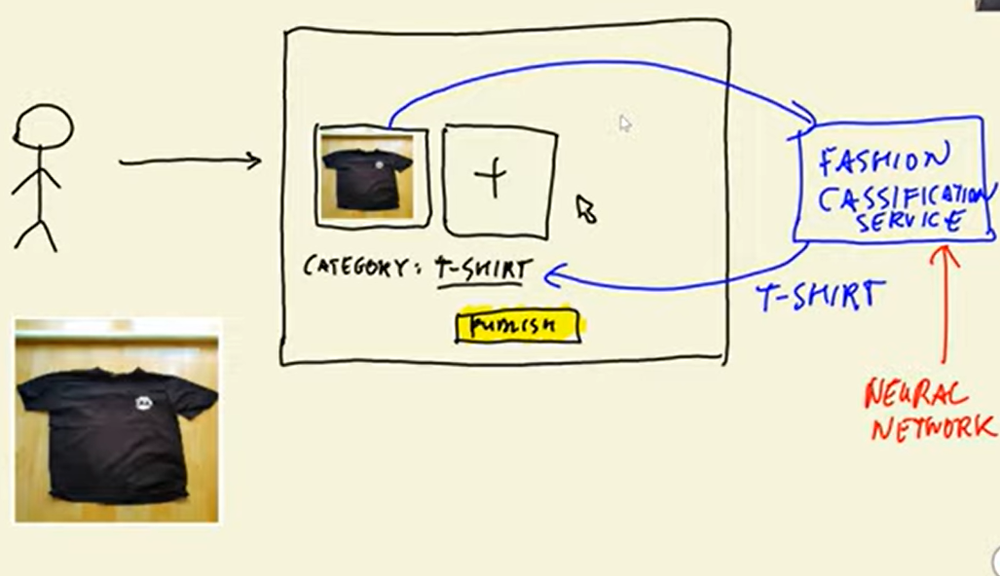

In [ ]:
git clone https://github.com/alexeygrigorev/clothing-dataset-small.git 
按照课程视频的要求，clone了这个仓库，放到和当前学习内容目录，平行的目录中，防止git混乱
当前学习记录的目录：/mnt/d/develop/mlops/ml
新的目录：/mnt/d/develop/mlops/clothing-dataset-small

# 8.2 Tensorflow and Keras
- Installing TensorFlow   深度学习框架,一个用于构建和训练深度学习模型的端到端开源平台
- Loading images
- 从技术上讲，TensorFlow 的底层张量运算能力也可以用来实现传统的机器学习算法（比如线性回归、逻辑回归）。
- 但是，这通常大材小用且代码更复杂。如果你要做传统机器学习，更主流的选择是 Scikit-learn。

我的环境是windows 10的wsl的Ubuntu 环境，我的电脑是有英伟达显卡的，我忘了前几年怎么搞这个环境的，反正现在Ubuntu环境中
如下：
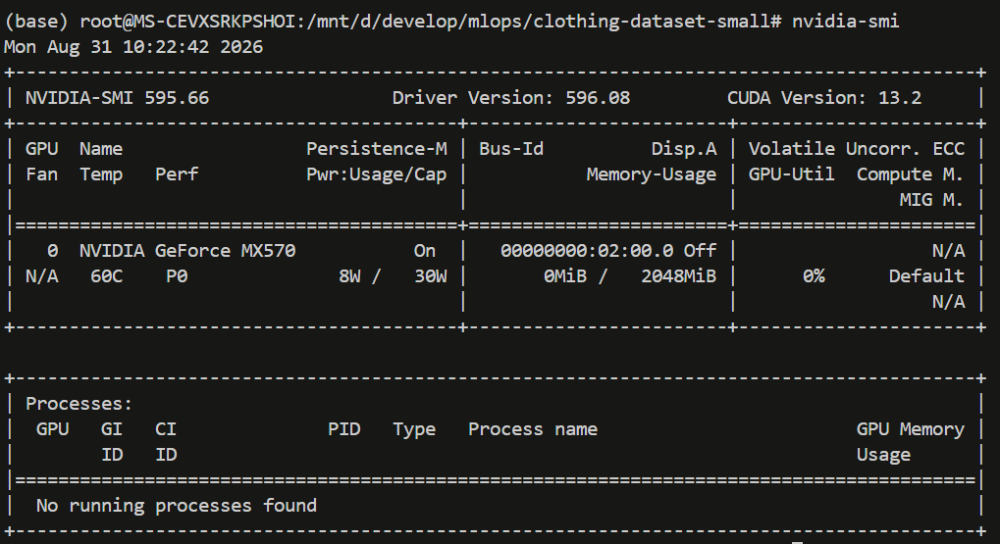
AI的建议是可以尝试在Ubuntu环境中，使用CUDA。有兴趣的可以自己研究一下，如何在n卡环境中，使用cuda。

- 还有这个网站：https://cs231n.github.io/  这是斯坦福大学关于神经网络的详细课程。有兴趣可以去学习了解，包含图像识别的神经网络

In [ ]:
pip install tensorflow

## 关于 有N卡的电脑使用GPU的方式--没有也没关系，但是CPU肯定巨慢，基本上是1000倍左右速度的差距
### 安装完成后，在 WSL 终端里，输入以下命令来验证 TensorFlow 能否真正识别 GPU：
python -c "import tensorflow as tf; print(tf.config.list_physical_devices('GPU'))"
### 如果输出类似 [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]，那就大功告成了！
### 输出：
(quant) root@MS-CEVXSRKPSHOI:/mnt/d/develop/mlops/ml# python -c "import tensorflow as tf; print(tf.config.list_physical_devices('GPU'))"

WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
I0000 00:00:1788431518.789184  246562 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

### 提示：如果您有英伟达的显卡，那么您就去问问AI，他会告诉你如何使用


In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
import tensorflow as tf
from tensorflow import keras
# Keras 是一个高级神经网络 API（应用程序编程接口），它提供了：
# 更简洁、易用的语法来构建深度学习模型
# 模块化的组件（层、优化器、损失函数等）
# 快速原型设计能力

In [4]:
# Keras 的图像处理工具
from tensorflow.keras.preprocessing.image import load_img 

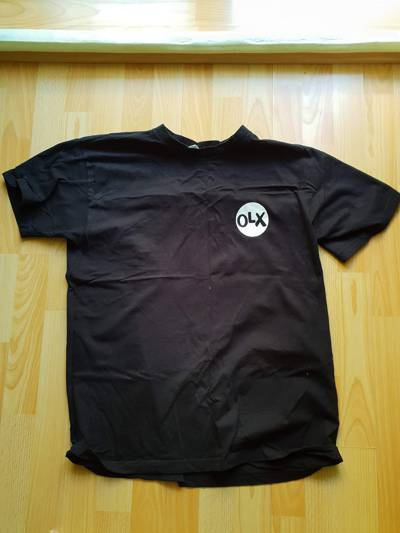

In [4]:
path = '../clothing-dataset-small/train/t-shirt'
name = '5f0a3fa0-6a3d-4b68-b213-72766a643de7.jpg'
fullname = f'{path}/{name}'
load_img(fullname)

In [5]:
# Keras 的图像处理工具加载一张图片，并调整大小到 299×299 像素
img = load_img(fullname, target_size=(299, 299)) 

In [6]:
x = np.array(img)
x.shape

(299, 299, 3)

x是个三维数组
    - 299行（从上到下）
    - 299列（从左到右）  
    - 3个颜色通道（红、绿、蓝）
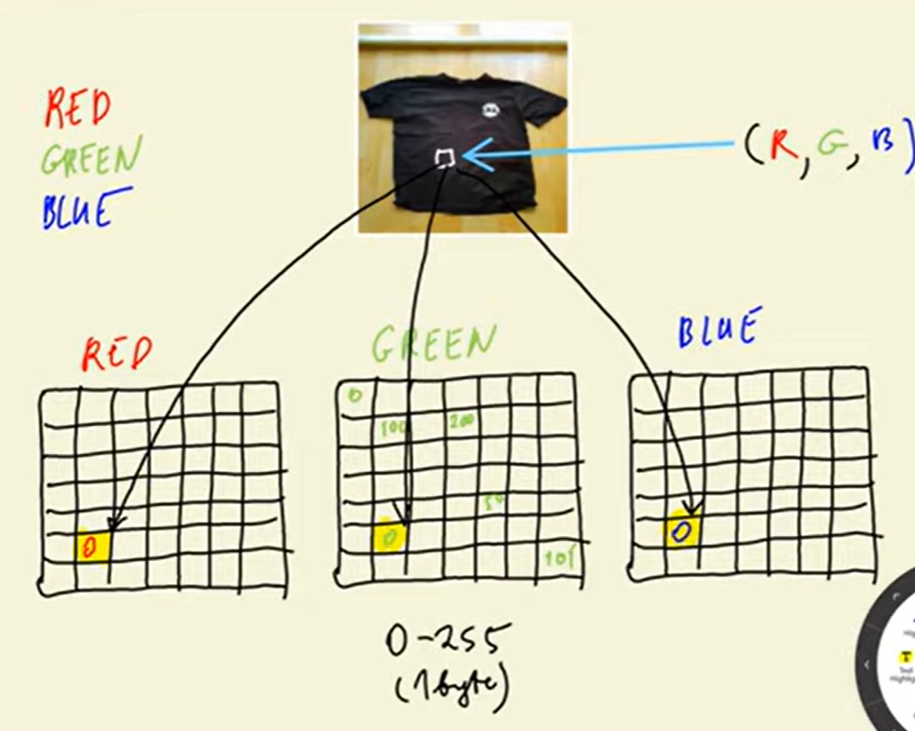
从上图可以看出：
- 任何彩色图像都由这三种颜色混合而成，就像颜料盒里的三原色。(R, G, B)  = (红色值, 绿色值, 蓝色值)
- 原图中白色方框中的部分，在三个代表R、G、B原色的二维表中，以0-255的值的范围显示，注意，三张二维表中，数值的位置是一样的，代表了原图中的白色方框中的图像内容

# 8.3 Pre-trained convolutional neural networks   预训练卷积神经网络
- Imagenet dataset: https://www.image-net.org/   #包含大量训练数据的数据集网站
- Pre-trained models: https://keras.io/api/applications/   # 模型的网站

In [4]:
from tensorflow.keras.applications.xception import Xception   #使用 keras中的Xception 模型
from tensorflow.keras.applications.xception import preprocess_input  # 数据预处理
from tensorflow.keras.applications.xception import decode_predictions # 解码预测结果

In [5]:
# 加载一个已经在 ImageNet 数据集上训练好的 Xception 模型
model = Xception(weights='imagenet', input_shape=(299, 299, 3))
# 模型会下载到：~/.keras/models/

I0000 00:00:1788432430.215978  248655 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1351 MB memory:  -> device: 0, name: NVIDIA GeForce MX570, pci bus id: 0000:02:00.0, compute capability: 8.6


In [9]:
# np.array([x]) 就是把单张图片包了一层，让模型知道"这是1张图片"
X = np.array([x])  

In [10]:
X.shape

(1, 299, 299, 3)

In [11]:
# 对输入数据进行标准化，让数据格式符合模型在训练时的要求
X = preprocess_input(X)

In [12]:
pred = model.predict(X)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


In [13]:
pred.shape  # Xception 默认是在 ImageNet 数据集上训练的，而 ImageNet 数据集恰好有 1000 个类别。

(1, 1000)

In [14]:
pred[0,610]  # 这是由下面的结果，逆推出来的，610这个索引，匹配下面的json中的额610，610索引对应的数值，是1000个数组中最大的

np.float32(0.6819623)

In [15]:
decode_predictions(pred) # 解码预测结果

[[('n03595614', 'jersey', np.float32(0.6819623)),
  ('n02916936', 'bulletproof_vest', np.float32(0.03814018)),
  ('n04370456', 'sweatshirt', np.float32(0.034324884)),
  ('n03710637', 'maillot', np.float32(0.011354235)),
  ('n04525038', 'velvet', np.float32(0.0018453652))]]

### Downloading data from https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json
它下载的是一个名为 imagenet_class_index.json 的 JSON 文件。

这个文件本质上是一个巨大的对照表，把模型输出的“数字代号（比如 n03595614）”和人类能看懂的“文字（比如 jersey）”一一对应起来。

模型推理完成后，输出的原始结果 pred 是一个长度为 1000 的数组，里面全是数字（概率值）。数组的第 0 个元素可能代表“猫”，第 1 个元素代表“狗”，但模型自己并不记得这些数字代表什么。

decode_predictions 函数必须依靠这个下载的 JSON 文件，才能把“第 610 个元素的概率最高”翻译成“jersey（球衣）”，让你能看懂结果。
____________________
上面得结果一共有5项内容，推荐优先顺序：jersey，bulletproof_vest，sweatshirt，maillot，velvet
查询这个内容：https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json，

可以得到以下得情况：
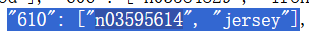

#  8.4 Convolutional neural networks       卷积神经网络  
- Types of layers: convolutional and dense    层的类型：卷积层和密集层（全连接层）  
- Convolutional layers and filters            卷积层和卷积核
- Dense layers                                 密集层：在神经网络中，密集层是一种全连接层
There are more layers. Read here: https://cs231n.github io/

## 卷积神经网络   是用于图像处理的神经网络
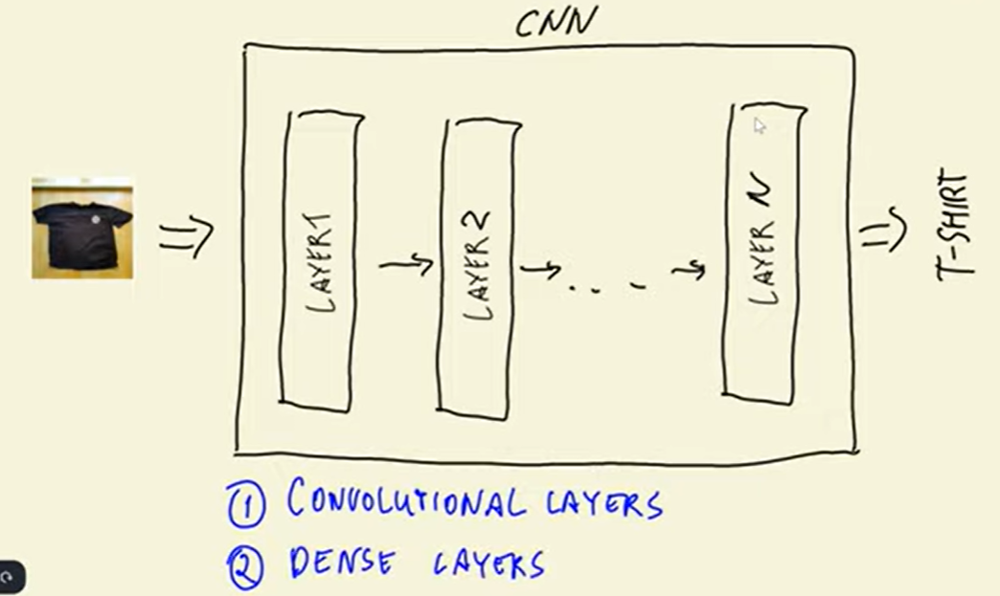

### ***接下来描述卷积神经网络的推理过程***
### 通常有两层组成：
- convolutional layers
- dense  layers

## “卷积”这个词听起来很唬人，但它的核心思想其实非常朴实。你可以把它理解为 “局部特征提取器” 或 “滤镜扫描仪”
1. 通俗理解：手电筒扫图
想象一下：

你有一张 高清大图（比如 1000x1000 像素）。

你手里拿着一个 小号的发光放大镜（比如 3x3 像素大小）。

你从图片的左上角开始，把放大镜盖在图片上，看清楚了这 3x3 区域里的图案（比如看到了一个猫耳朵的弧度）。

然后你把放大镜往右挪一格，再看新的 3x3 区域（看到了猫耳朵的另一个弧度）。

你一行一行地扫，直到把整张图片全部扫完。

这个“拿着小窗口一点点扫过整张图”的过程，就是卷积！

2. 这么做的目的是什么？—— “找特征”
你在扫图的时候，手里的“放大镜”其实是有功能的，我们把这个放大镜叫做 “卷积核（Kernel）” 或 “过滤器（Filter）”。

有的放大镜专门找 “横线”（横着亮，竖着暗）。

有的放大镜专门找 “弧线”（弯弯的形状）。

有的放大镜专门找 “红色色块”。

当这个放大镜扫过图片时，如果扫到的区域正好有一根横线，那这个区域的“响应值”就会很高（被激活）；如果扫到的是空白区域，响应值就是 0。

***卷积的本质就是：把图片切成无数个小碎片，和手里的“特征放大镜”做对比，看看哪里匹配。***
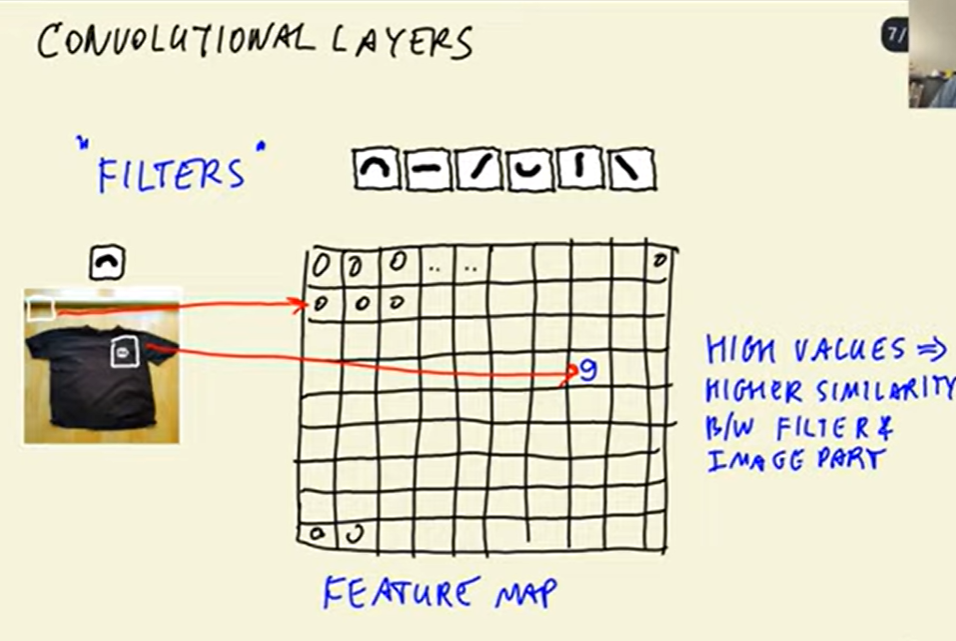

上图，特征图中的9，就是高相似的，0就是代表不匹配的。


每个卷积核（Filter），1个特征图，输入是图像，输出是特征图（Feature Map）,本质上是一个数字矩阵。

卷积核（Filter）：一组小的数字矩阵（例如 3x3x3）。

运算：卷积核在图片上滑动，做点积运算（对应位置相乘再求和）。

输出：一个新的、尺寸变小的矩阵（例如 224x224 变成了 112x112），这个矩阵里的每一个数字，代表了该卷积核在图片那个局部区域上“激活”的强度。
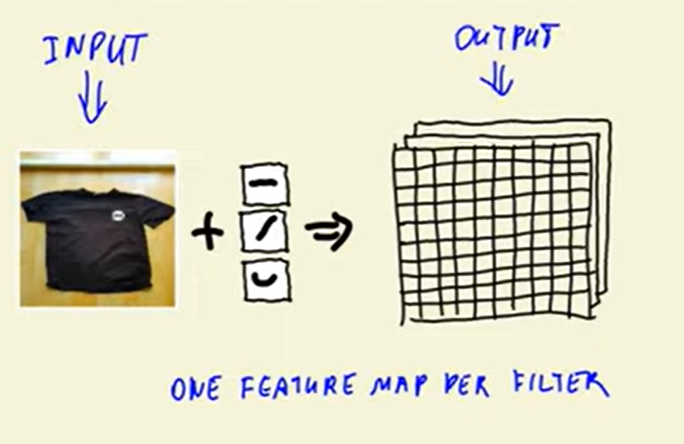


多个卷积层 CL1  CL2  CL3，每层都可以有自己的卷积核（Filter），生成更多的特征图
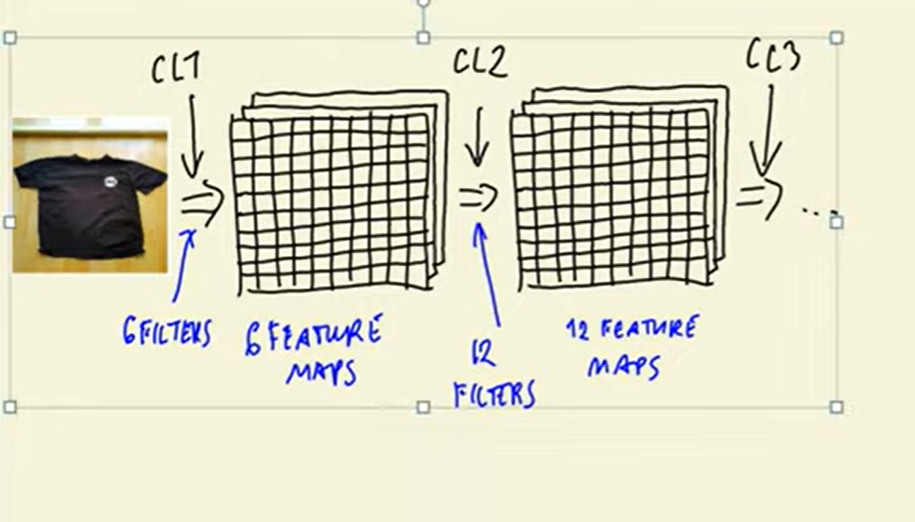


如下图：卷积核（Filter）逐渐变的复杂，第2个卷积核中的形状，是由第1个过滤器中的形状组成，依次类推

每个卷积层输出的就是多个特征图在通道维度上"堆叠"成的三维块，这块东西又作为下一卷积层的输入，被下一层的卷积核扫描，再产出新的三维块。
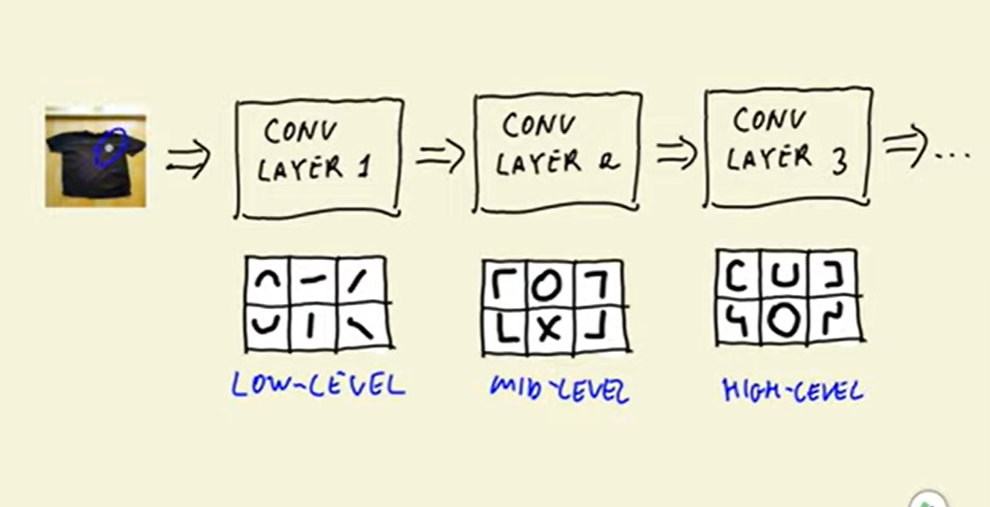

卷积层输出的内容，不是直观的“这是什么”，而是“像什么的概率分布”。
输出矩阵中的每一个数值，可以理解为该区域属于某个特定模式（Pattern）的置信度。
在推理（而非训练）时：
卷积层输出的内容，是一系列代表“特定图案激活强度”的数字矩阵。它不输出“这是一只猫”，而是输出“这张图片的各个局部与‘猫耳朵’‘猫眼睛’等基础模式有多吻合”。
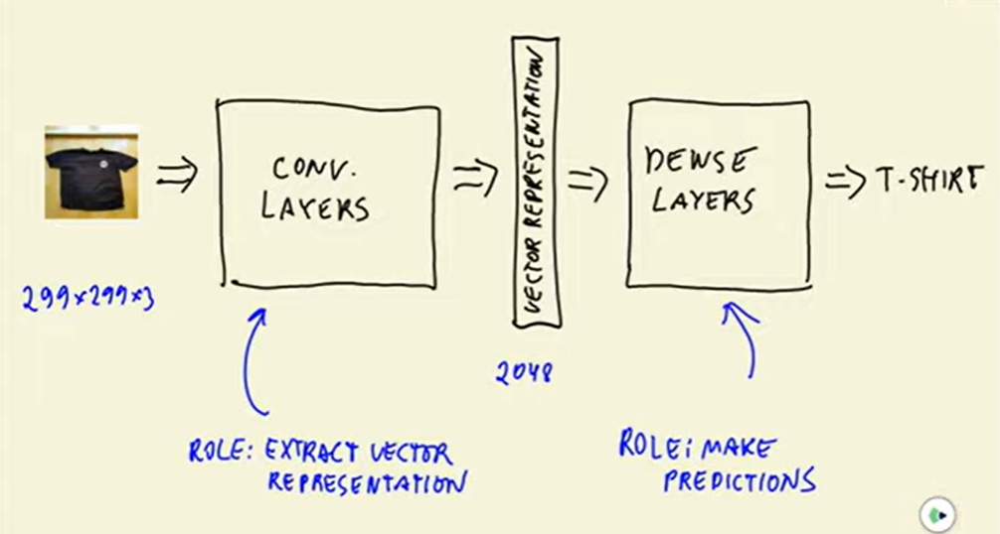

### 1. 什么是“向量表示法”？（从实物到数字）
在计算机眼里，没有“猫”也没有“狗”，没有T恤，也有裙子，只有数字列表（即向量）。

输入的向量：原始图片是一个巨大的向量（例如 299x299x3 = 268203 个数字，代表红绿蓝的亮度）。

输出的向量：经过卷积层后，Alexey 所说的“向量表示法--vector  representation”，是指将这张图片浓缩成一个固定长度的、富含语义特征的数字列表。

打个比方：这就像你向一位侦探描述一个嫌疑人。
你给的原始数据是：“他身高180cm，穿红色上衣，黑色裤子……”（这是原始像素）。
卷积层的作用是提取出更高级的特征：“他长着一张‘国字脸’、戴着‘金丝眼镜’、眼神‘凶狠’。”（这是向量表示）。
卷积层充当了一个“智能翻译官”。它将人类看不懂的“像素矩阵”（RAW数据），翻译成了计算机容易理解的“语义向量”（特征向量），这个向量浓缩了图片的“含义”，供最后的决策层进行判断。
最后全密集层（分类器）根据这些特征得出结论：“这是‘张三’！”


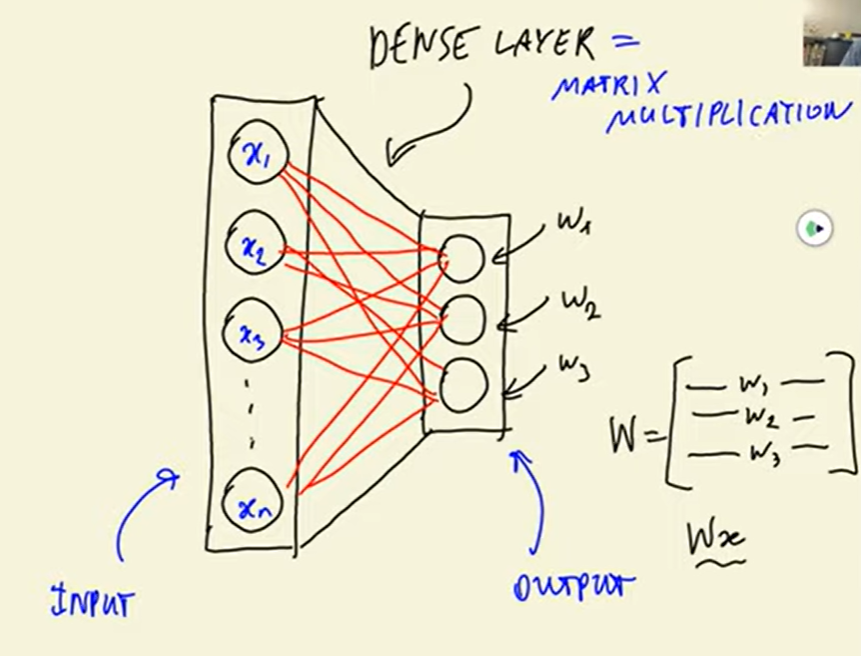

### 全连接层在推理时到底在干什么？
- 它在做 “加权投票”。

过程如下：

- 把最后一层卷积输出的特征向量（比如 2048 个数字）作为输入。

- 全连接层的每一个神经元，都有2048 个已经训练好的固定权重（就像一份投票权重的清单）。

- 它计算：输出得分 = 输入数字1\*权重1 + 输入数字2\*权重2 + ... + 输入数字4096*权重4096 + 偏置

- 如果是分类任务，***最后再经过 Softmax 函数***，将这组得分转换成概率（比如：猫 0.02，狗 0.97，兔子 0.01）。

### 2. 推理过程，总结一下：
- 卷积层：完成特征提取，输出是一个三维张量（高 x 宽 x 通道数）。

- 池化层 (pool)

作用：降低数据维度，增强特征鲁棒性。它在一个小窗口内取最大值或平均值，从而缩小特征图的尺寸。

效果：减少了后续层的计算量，并让模型对微小的平移、旋转等变化不那么敏感。

- Flatten（压平层）：将这个三维张量拉伸成一维（变成一个很长的数字列表，比如 25088 个数字）。

- 全连接层/密集层：接受这个一维向量作为输入。使用已经训练好的固定权重，对输入特征进行加权求和，计算出每个类别的得分。

- Softmax：将得分转换成概率，输出最可能的类别（“有 97% 的把握这是一只狗”）。

————————————————————————————————————————————————————————————————
### 神经网络得基本理解--不研究算法，只理解逻辑
#### 我没有去看，斯坦福得神经网络课程内容，我觉得对我来说，比较难懂了，
#### 但我尝试了和AI对话得方式，基于我们之前跟着alexey老师所学得内容，对
#### 神经网络进行理解。--**训练模型的理解**

1. 准备阶段：数据 + 标签
- 原始数据：一张猫的图片（像素矩阵）。

- 向量化：把图片变成一堆数字（比如 299×299×3 的数组）。

- 标签值：给这堆数字贴上一个名字，比如 [1,0,0]（表示“猫”）。

2. 是如何计算出权重值的？
- 答案是：并不是直接“算”出来的，而是通过无数次“猜”和“纠错”逼出来的。

#### **具体的数学过程是这样的**：

- 随机初始化：一开始，网络里的所有权重（Weights）都是随机的小数。此时网络完全是个“傻子”。
（该步骤发生在：所有层（卷积层 + 全连接层）的权重初始化阶段。）

- 前向传播（猜）：把猫的图片向量送进网络，经过一系列加权求和，网络输出一个结果，比如 [0.2, 0.6, 0.2]（意思是：20%像猫，60%像狗，20%像兔子）。显然，因为权重是随机的，这个结果是错的。
（该步骤贯穿：卷积层 → 全连接层 → 输出层，即整个网络的前向计算过程。）

- 计算损失（看差距）：把网络的猜测结果 [0.2, 0.6, 0.2] 和真实的标签值 [1, 0, 0] 代入损失函数（Loss Function）。损失函数会算出一个数值，比如 0.8。这个数字代表“错得有多离谱”。
（该步骤发生在：输出层之后的损失计算模块，如 categorical_crossentropy。）

- 反向传播（纠错）：这是最关键的一步。运用微积分的链式法则，从损失函数（输出端）开始，倒着一层层计算，算出“每一个权重对这个错误（0.8）贡献了多少”。
（该步骤从输出层开始，逐层向后传播，经过全连接层 → 卷积层，直到输入层为止。）

- 更新权重：知道了每个权重的“犯错贡献值”后，算法就会稍微调整（增加或减少）这些权重的数值，让下一次计算出来的损失值变小一点点。
（该步骤发生在：优化器（如SGD、Adam）更新所有可训练层的权重，包括卷积层和全连接层，具体方式为：权重_new = 权重_old - 学习率 × 梯度。）

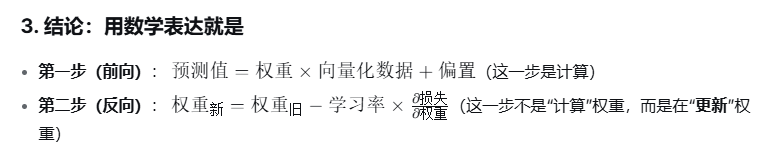

#### 神经网络权重值得计算逻辑
- 带标签的数据通过计算预测值和真实标签之间的误差，指导着权重值从随机状态，沿着数学上下降最快方向，一步步迭代更新到最优状态。

### 总结下： 训练和推理的区别
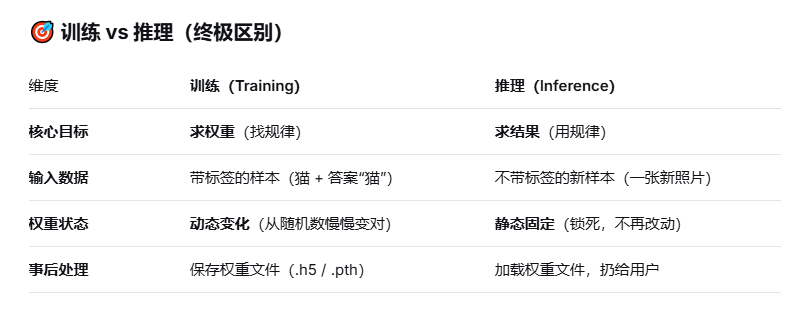

# 8.5 Transfer learning  
# 迁移学习：一种机器学习方法，通过将已经训练好的模型应用于新的任务中，来提高新任务的学习效果。
- Reading data with ImageDataGenerator      使用 ImageDataGenerator 读取数据
- Train Xception on smaller images (150x150)    小尺寸图像（150x150）上的Xception训练
(Better to run it with a GPU)

#### 当前学过的卷积神经网络CNN，推理过程
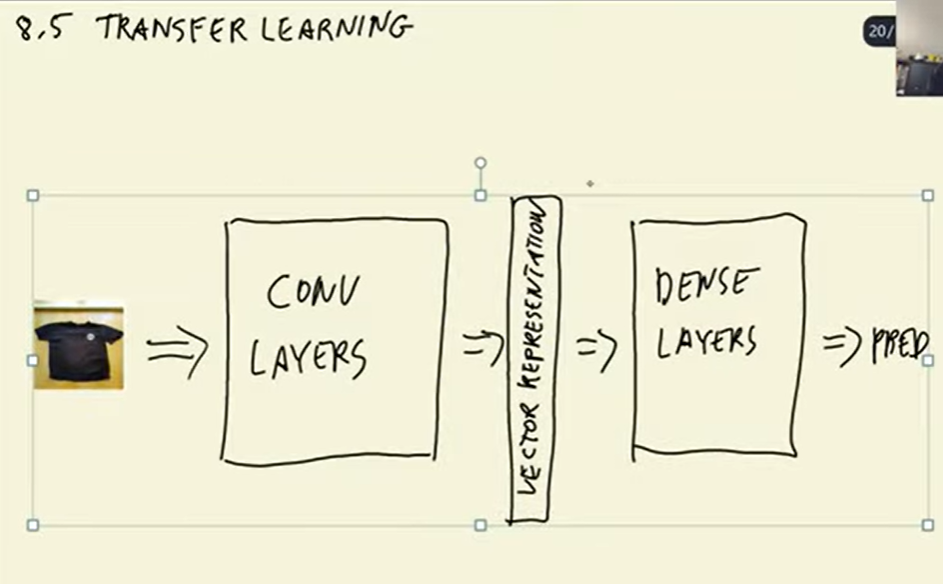

#### 训练CNN模型是非常不容易，需要有非常多的原始数据和标签值，就是原始数据要做标注，需要有足够的GPU算力，还需要有优秀的算法工程师。

#### 保留卷积层，训练新的密集层
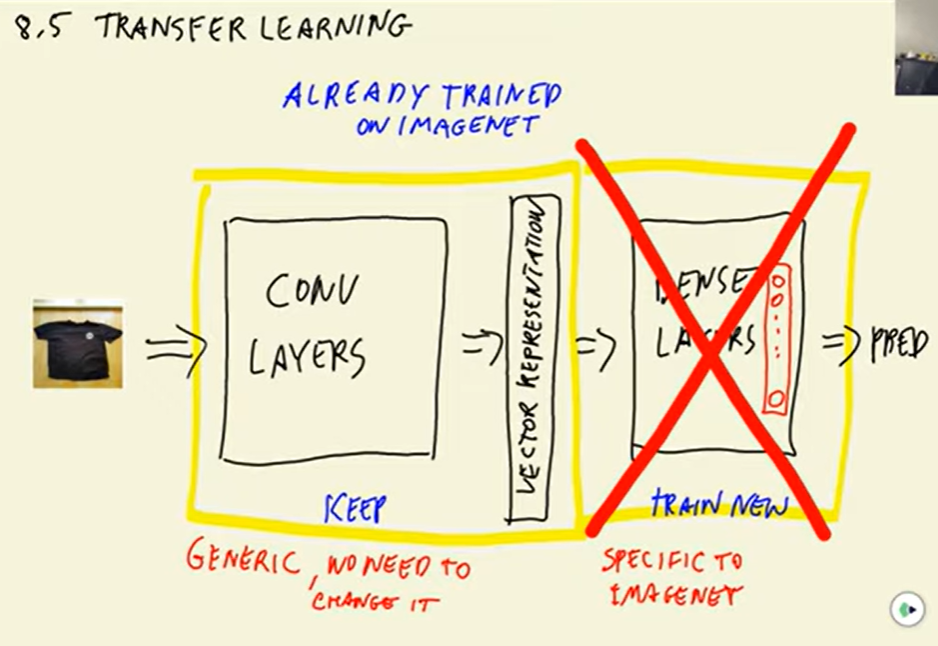

1. 为什么这叫“迁移”？ （名字的由来）
- “知识迁移”：把卷积层已经学会的“知识”（通用特征提取能力）复制过来使用，而不是重新学习。

- “资产复用”：CNN的卷积层（边缘、纹理等基础特征）具有极高的通用性。把在大规模数据集（如ImageNet）上“练出来的肌肉记忆”直接拿过来用，就是“迁移”。

- “只换脑，不换眼”：把人家的“眼睛”（卷积层）拿来，只换自己的“大脑”（密集层），这正是迁移学习的精髓。

2. 什么时候需要这样做？（应用场景）
该技术在以下几种场景中特别有价值：

- **你需要“小样本学习”时**：你只有几千张图片，而从头训练模型需要数百万张。“保留卷积层”可以防止严重过拟合。

- **你的数据与原始数据集相似时**：如果你要识别“不同品种的狗”或“不同类型的车”，用ImageNet上训好的模型直接提取特征，效果立竿见影。

- **你没有足够的算力时**：从头训练需要好几个GPU跑几周，而“只训练密集层”可以在单张普通GPU上几小时搞定。

- **你需要快速迭代业务模型时**：当业务需要快速上线一个新分类（比如识别新上架的10款鞋子），不需要重新训练全部参数，只需重新训练最后一层全连接层即可。

In [5]:
# ，用于在训练过程中动态生成批量图像数据，并对图像进行随机变换（如旋转、缩放、翻转等），以扩充数据集、提升模型的泛化能力。
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [17]:
# 训练数据生成
train_gen = ImageDataGenerator(preprocessing_function=preprocess_input) # 创建了一个用于训练的、带数据预处理的数据生成器

train_ds = train_gen.flow_from_directory(
    '../clothing-dataset-small/train', #从指定文件夹中批量读取图片
    target_size=(150, 150),  # 统一缩放到 150x150 像素
    batch_size=32 # 并以每批 32 张的方式提供给模型训练
)
# shuffle=True（默认）：每个 epoch（一轮完整训练）开始时，生成器会随机打乱所有图片的顺序，然后按打乱后的顺序分成一个个 batch 喂给模型。

Found 3068 images belonging to 10 classes.


In [29]:
!ls -l ../clothing-dataset-small/train

total 0
drwxrwxrwx 1 root root 4096 Aug 31 09:47 dress
drwxrwxrwx 1 root root 4096 Aug 31 09:47 hat
drwxrwxrwx 1 root root 4096 Aug 31 09:47 longsleeve
drwxrwxrwx 1 root root 4096 Aug 31 09:47 outwear
drwxrwxrwx 1 root root 4096 Aug 31 09:47 pants
drwxrwxrwx 1 root root 4096 Aug 31 09:47 shirt
drwxrwxrwx 1 root root 4096 Aug 31 09:47 shoes
drwxrwxrwx 1 root root 4096 Aug 31 09:47 shorts
drwxrwxrwx 1 root root 4096 Aug 31 09:47 skirt
drwxrwxrwx 1 root root 4096 Aug 31 09:47 t-shirt


In [18]:
train_ds.class_indices #返回一个字典（Dictionary），它显示了文件夹中各个子目录名称对应的数字标签（索引）

{'dress': 0,
 'hat': 1,
 'longsleeve': 2,
 'outwear': 3,
 'pants': 4,
 'shirt': 5,
 'shoes': 6,
 'shorts': 7,
 'skirt': 8,
 't-shirt': 9}

In [19]:
X, y = next(train_ds)  # 手动从训练数据生成器中取出一批数据

In [20]:
X

array([[[[ 0.07450986,  0.0196079 , -0.05882353],
         [ 0.12941182,  0.07450986, -0.00392157],
         [ 0.16078436,  0.10588241,  0.02745104],
         ...,
         [ 0.654902  ,  0.6156863 ,  0.5686275 ],
         [ 0.6392157 ,  0.6       ,  0.5529412 ],
         [ 0.6392157 ,  0.6       ,  0.5529412 ]],

        [[ 0.09019613,  0.03529418, -0.04313725],
         [ 0.12941182,  0.07450986, -0.00392157],
         [ 0.14509809,  0.09019613,  0.01176476],
         ...,
         [ 0.6627451 ,  0.62352943,  0.5764706 ],
         [ 0.654902  ,  0.6156863 ,  0.5686275 ],
         [ 0.64705884,  0.60784316,  0.56078434]],

        [[ 0.09803927,  0.04313731, -0.03529412],
         [ 0.12156868,  0.06666672, -0.01176471],
         [ 0.14509809,  0.09019613,  0.01176476],
         ...,
         [ 0.67058825,  0.6313726 ,  0.58431375],
         [ 0.6627451 ,  0.62352943,  0.5764706 ],
         [ 0.654902  ,  0.6156863 ,  0.5686275 ]],

        ...,

        [[ 0.6       ,  0.54509807,  0

In [21]:
# y 不是凭空产生的，也不是藏在图片里的。它是 flow_from_directory() 通过“图片所在文件夹的名字”自动生成的数字标签。
#  flow_from_directory() 把“文件夹名字”当作了标签的载体。它做了一件非常聪明的事：它认为“一个文件夹里的所有图片，都属于这个文件夹所代表的类别”。
y[:5]  # 取前5个元素

array([[0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]], dtype=float32)

In [22]:
y.shape

(32, 10)

### y值得解释
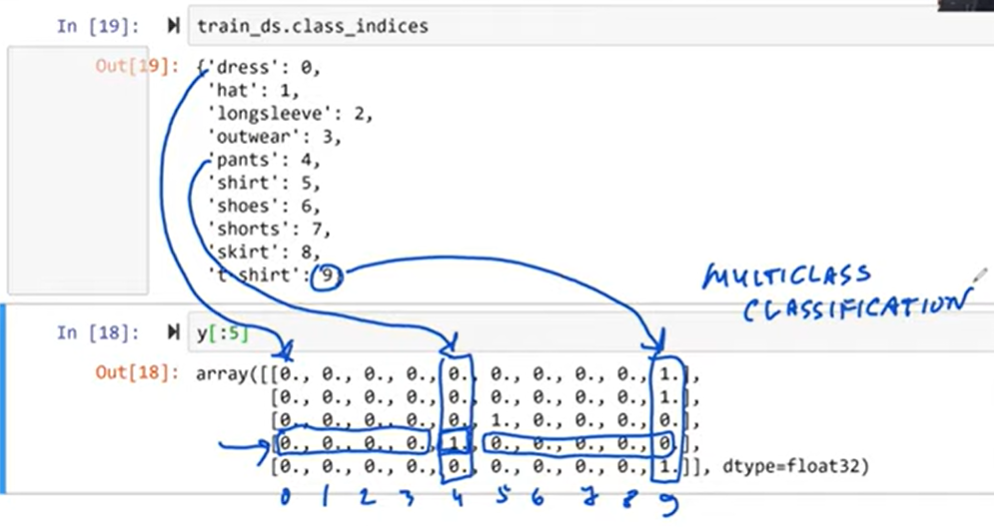

In [23]:
# 验证数据生成
val_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

val_ds = val_gen.flow_from_directory(
    '../clothing-dataset-small/validation',
    target_size=(150, 150),
    batch_size=32,
    shuffle=False  #按文件系统里的顺序（通常是文件名排序）依次读取，永远不变。
)
# 验证集的主要作用是稳定地评估模型表现。如果每次验证时图片顺序都随机变化，会导致：
# 每次验证的数据顺序不同，虽然整体分布一样，但模型对顺序不敏感，理论上不影响准确率。
#更重要的是：如果验证集需要和某个“参考基准”对比（比如上一个版本的模型），固定顺序能让对比结果更可靠、更好复现。

Found 341 images belonging to 10 classes.


In [24]:
#典型的迁移学习模型构建流程：使用预训练的 Xception 作为特征提取器，在其顶部添加自定义分类层。
base_model = Xception(
    weights='imagenet',          #使用在 ImageNet 数据集上预训练好的权重
    include_top=False,           # 不包含顶部的全连接分类层
    input_shape=(150, 150, 3)    #  输入图像的尺寸
)

base_model.trainable = False    # 冻结基座模型



inputs = keras.Input(shape=(150, 150, 3))  #定义输入层，与 base_model 的 input_shape 保持一致。

base = base_model(inputs, training=False)  # 将输入传入冻结的 Xception 模型，输出形状为 (None, 5, 5, 2048)。training=False 确保 BatchNormalization 层使用推理模式，不会更新均值和方差。

vectors = keras.layers.GlobalAveragePooling2D()(base)  #对每个 5x5 的特征图取全局平均，将 (None, 5, 5, 2048) 压缩为 (None, 2048)。这一步是把空间信息“压平”，同时保留每个通道的全局响应。

outputs = keras.layers.Dense(10)(vectors)  # 把 2048 维的图像特征向量，映射成 10 维的分类得分向量，每个维度对应一个服装类别。

model = keras.Model(inputs, outputs)  # 

include_top=False  这个参数得理解
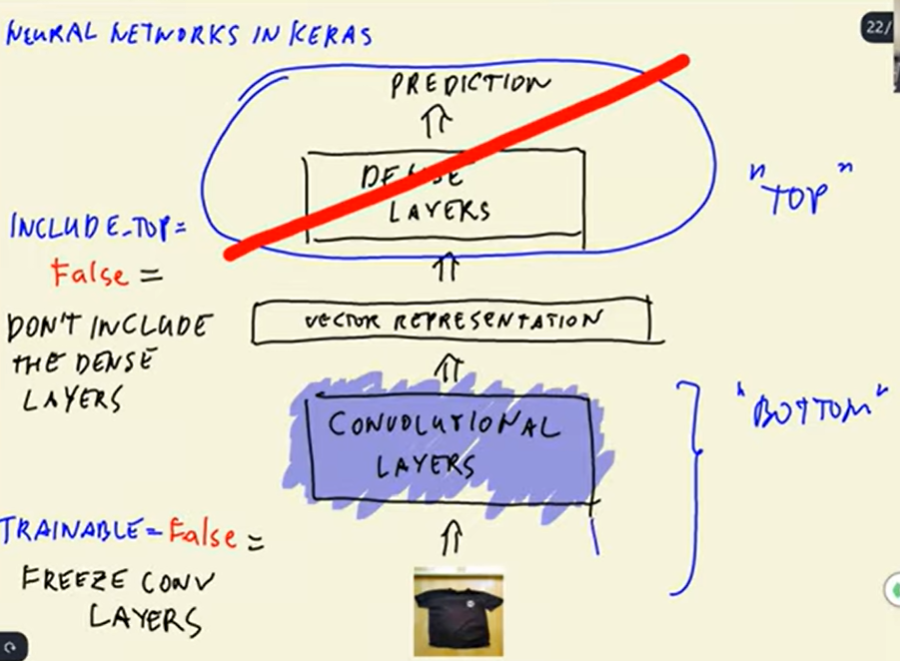

In [25]:
# 这段代码是模型训练的“配置阶段”，在调用 model.fit() 之前，必须完成这些设置。它定义了模型如何学习、如何衡量错误、以及如何评估自己。
learning_rate = 0.01  #控制每次参数更新的步长，每一步只调整权重的 1%
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)  #  这个优化器，决定如何更新权重。

loss = keras.losses.CategoricalCrossentropy(from_logits=True)  # 衡量预测值和真实标签之间的差距。损失函数是“错误计分器”，数值越大说明错得越离谱。模型的目标就是不断降低这个数值。

# 编译模型：把优化器、损失函数、评估指标组装到一起，完成训练前的最后配置。
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])  # metrics=['accuracy']：指定在训练和验证过程中，除了损失值外，还要额外计算并显示准确率。

In [67]:
# epoch 是训练的总轮数
history = model.fit(train_ds, epochs=10, validation_data=val_ds)

Epoch 1/10


I0000 00:00:1788262027.126161    3826 generator_dataset_op.cc:213] Memory patch applied: M_TRIM_THRESHOLD=128 kb was set.


96/96 ━━━━━━━━━━━━━━━━━━━━ 159s 2s/step - accuracy: 0.6591 - loss: 1.2807 - val_accuracy: 0.7155 - val_loss: 1.0471
Epoch 2/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 161s 2s/step - accuracy: 0.8334 - loss: 0.5034 - val_accuracy: 0.7566 - val_loss: 0.9529
Epoch 3/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 184s 2s/step - accuracy: 0.8804 - loss: 0.3413 - val_accuracy: 0.8123 - val_loss: 0.7192
Epoch 4/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 191s 2s/step - accuracy: 0.9045 - loss: 0.2750 - val_accuracy: 0.7859 - val_loss: 0.8500
Epoch 5/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 214s 2s/step - accuracy: 0.9420 - loss: 0.1595 - val_accuracy: 0.7859 - val_loss: 0.9519
Epoch 6/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 231s 2s/step - accuracy: 0.9485 - loss: 0.1437 - val_accuracy: 0.7801 - val_loss: 0.9984
Epoch 7/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 217s 2s/step - accuracy: 0.9645 - loss: 0.1000 - val_accuracy: 0.7801 - val_loss: 0.9912
Epoch 8/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 234s 2s/step - accuracy: 0.9840 - loss: 0.0535 - val_accuracy: 0.7977 - val_loss: 0.

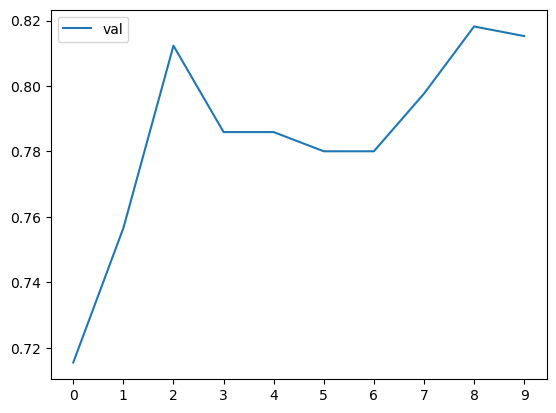

In [69]:
#plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='val')
plt.xticks(np.arange(10))
plt.legend()

In [ ]:
81.52%，初次验证已经能接受，接下来调参

# 8.6 Adjusting the learning rate   调整学习率
- What's the learning rate   
- Trying different values

- 学习率：类比读书的速度
- 每年读了很多书，读书的速度非常快！这种学习率是：HIGH，这种情况学习到的东西很肤浅，没有学习到足够多的东西。
- 每年读了适量的书，读书的速度适中，这种学习率是：MEDIUM，这种情况读书的质和量，都能保证
- 每年只读1本书，读书的速度最慢，这种学习率是：LOW，这种情况，读书的量严重不足，缺少必要的知识
如果把以上三种学习，定义为模型的training，那么验证模型能力的话，他们的结果和状态分别就是：
- POORLY       DOVERFITTING
- GOOD             OK
- POORLY       UNDERFITTING

如图：

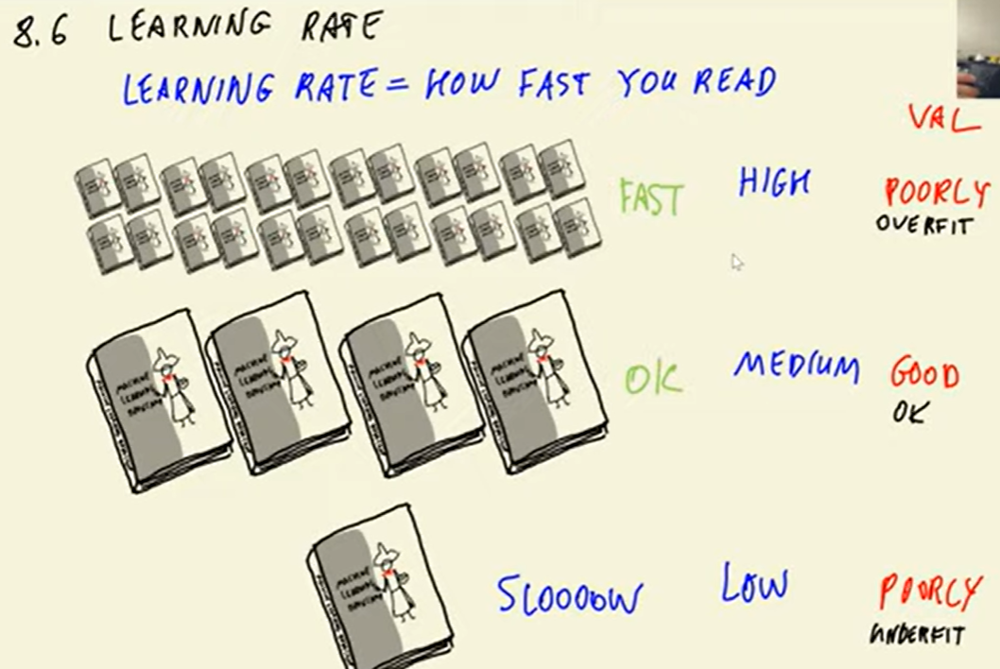

### 举上面的例子，就是为了告诉读者：想要1个模型能够有更好的准确度，需要尝试使用不同的学习率和多次训练，
### 才能得到一系列的结果，从而对结果进行分析和择优选择 ***学习率的值***。

In [11]:
# 将上1节的内容，包装为1个函数
def make_model(learning_rate=0.01):
    base_model = Xception(
        weights='imagenet',
        include_top=False,
        input_shape=(150, 150, 3)
    )

    base_model.trainable = False

    #########################################

    inputs = keras.Input(shape=(150, 150, 3))
    base = base_model(inputs, training=False)
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    outputs = keras.layers.Dense(10)(vectors)
    model = keras.Model(inputs, outputs)
    
    #########################################

    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    loss = keras.losses.CategoricalCrossentropy(from_logits=True)

    model.compile(
        optimizer=optimizer,
        loss=loss,
        metrics=['accuracy']
    )
    
    return model

In [27]:
scores = {}

for lr in [0.0001, 0.001, 0.01, 0.1]:
    print(lr)

    model = make_model(learning_rate=lr)
    history = model.fit(train_ds, epochs=10, validation_data=val_ds)
    scores[lr] = history.history

    print()
    print()

0.0001
Epoch 1/10


I0000 00:00:1788314641.437684    1702 generator_dataset_op.cc:213] Memory patch applied: M_TRIM_THRESHOLD=128 kb was set.


96/96 ━━━━━━━━━━━━━━━━━━━━ 193s 2s/step - accuracy: 0.3706 - loss: 1.8891 - val_accuracy: 0.5191 - val_loss: 1.5705
Epoch 2/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 264s 3s/step - accuracy: 0.5580 - loss: 1.3700 - val_accuracy: 0.6012 - val_loss: 1.2473
Epoch 3/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 310s 3s/step - accuracy: 0.6349 - loss: 1.1417 - val_accuracy: 0.6569 - val_loss: 1.0781
Epoch 4/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 225s 2s/step - accuracy: 0.6796 - loss: 1.0056 - val_accuracy: 0.6891 - val_loss: 0.9706
Epoch 5/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 254s 3s/step - accuracy: 0.7066 - loss: 0.9129 - val_accuracy: 0.7097 - val_loss: 0.8944
Epoch 6/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 305s 3s/step - accuracy: 0.7265 - loss: 0.8459 - val_accuracy: 0.7331 - val_loss: 0.8407
Epoch 7/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 292s 3s/step - accuracy: 0.7396 - loss: 0.7930 - val_accuracy: 0.7449 - val_loss: 0.8076
Epoch 8/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 259s 3s/step - accuracy: 0.7562 - loss: 0.7510 - val_accuracy: 0.7742 - val_loss: 0.

In [30]:
scores

{0.0001: {'accuracy': [0.37059974670410156,
   0.5580182671546936,
   0.6349413394927979,
   0.6795958280563354,
   0.7066493034362793,
   0.7265319228172302,
   0.7395697236061096,
   0.7561929821968079,
   0.7705345749855042,
   0.78194260597229],
  'loss': [1.8891286849975586,
   1.3699599504470825,
   1.1417431831359863,
   1.0055651664733887,
   0.9129371047019958,
   0.8458572626113892,
   0.793034017086029,
   0.7509519457817078,
   0.7143654227256775,
   0.6840298175811768],
  'val_accuracy': [0.5190615653991699,
   0.6011730432510376,
   0.6568915247917175,
   0.6891495585441589,
   0.7096773982048035,
   0.733137845993042,
   0.7448680400848389,
   0.774193525314331,
   0.7800586223602295,
   0.7917888760566711],
  'val_loss': [1.5705349445343018,
   1.247275948524475,
   1.0781493186950684,
   0.9705792665481567,
   0.894353985786438,
   0.8407363891601562,
   0.8075730800628662,
   0.7683588862419128,
   0.7444581985473633,
   0.723605751991272]},
 0.001: {'accuracy': [0.62

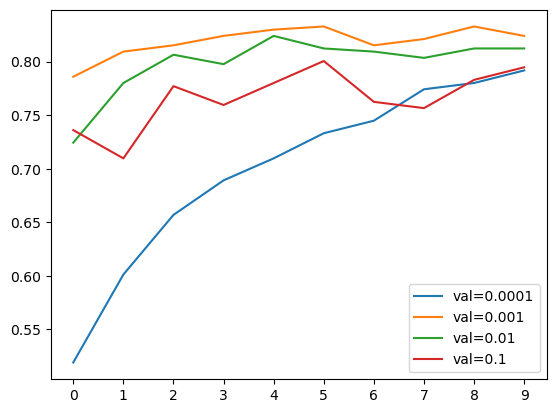

In [37]:
for lr, hist in scores.items():
    plt.plot(hist['val_accuracy'], label=('val=%s' % lr))
#plt.ylim(0, 0.85)
plt.xticks(np.arange(10))
plt.legend()

In [ ]:
# 根据上图结果，我们选择 0.001，这个学习率
learning_rate= 0.001

# 8.7 Checkpointing
- Saving the best model only
- Training a model with callbacks

### 检查点，是模型在每次迭代后，或满足某些条件时，保存我们的模型的方法。
### 例如，当模型实现了，迄今为止的最佳性能时，比如上图的val_accuracy=0.825，时，但我们还想看前面的1个val_accuracy峰值的模型状态。然后保存模型。
如图：  
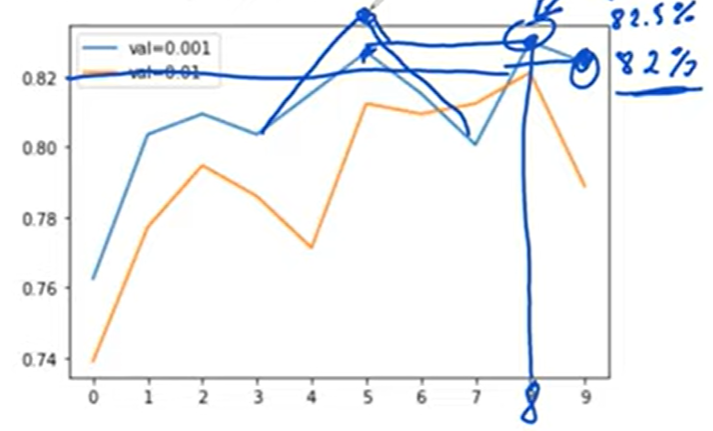

这就是检查点的作用。

In [42]:
# 保存模型权重的标准命令。
# model.save_weights('model_v1.h5', save_format='h5')
# 'model_v1.h5'：保存的文件名。
# .h5 是 HDF5 格式的扩展名，这是一种专为存储大量科学数组数据设计的二进制文件格式。
# 全称：Hierarchical Data Format version 5（层次数据格式第5版）
# 归属：由美国国家超级计算应用中心（NCSA）研发，属于学术界和科学计算领域的通用数据格式。
# 糟糕报错了：我的TensorFlow/Keras 版本中，save_weights() 方法已经不再支持 save_format 这个参数了。
model.save_weights('model_v1.weights.h5')

In [43]:
# 在模型训练过程中设置一个 自动保存检查点（Checkpoint） 的回调函数
chechpoint = keras.callbacks.ModelCheckpoint(
    'xception_v1_{epoch:02d}_{val_accuracy:.3f}.h5',  #一个动态生成的文件名
    save_best_only=True, #只保存性能最好的那一个（而不是每轮都存）。
    monitor='val_accuracy',  #监控指标：验证集准确率（val_accuracy）。
    mode='max' # 优化方向：'max' 表示数值越大越好（准确率当然越高越好）
)

In [44]:
# 用0.001的学习率，训练模型10次
learning_rate = 0.001

model = make_model(learning_rate=learning_rate)

history = model.fit(
    train_ds,
    epochs=10,
    validation_data=val_ds,
    callbacks=[chechpoint]
)

Epoch 1/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6366 - loss: 1.0950

96/96 ━━━━━━━━━━━━━━━━━━━━ 186s 2s/step - accuracy: 0.6366 - loss: 1.0950 - val_accuracy: 0.7742 - val_loss: 0.7106
Epoch 2/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7839 - loss: 0.6288

96/96 ━━━━━━━━━━━━━━━━━━━━ 185s 2s/step - accuracy: 0.7839 - loss: 0.6288 - val_accuracy: 0.8123 - val_loss: 0.6134
Epoch 3/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 174s 2s/step - accuracy: 0.8308 - loss: 0.5070 - val_accuracy: 0.8006 - val_loss: 0.5901
Epoch 4/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8595 - loss: 0.4240

96/96 ━━━━━━━━━━━━━━━━━━━━ 167s 2s/step - accuracy: 0.8595 - loss: 0.4240 - val_accuracy: 0.8182 - val_loss: 0.5645
Epoch 5/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 166s 2s/step - accuracy: 0.8915 - loss: 0.3662 - val_accuracy: 0.8094 - val_loss: 0.5456
Epoch 6/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9091 - loss: 0.3207

96/96 ━━━━━━━━━━━━━━━━━━━━ 185s 2s/step - accuracy: 0.9091 - loss: 0.3207 - val_accuracy: 0.8240 - val_loss: 0.5273
Epoch 7/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 195s 2s/step - accuracy: 0.9250 - loss: 0.2871 - val_accuracy: 0.8123 - val_loss: 0.5233
Epoch 8/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 184s 2s/step - accuracy: 0.9358 - loss: 0.2592 - val_accuracy: 0.8152 - val_loss: 0.5390
Epoch 9/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9436 - loss: 0.2277

96/96 ━━━━━━━━━━━━━━━━━━━━ 191s 2s/step - accuracy: 0.9436 - loss: 0.2277 - val_accuracy: 0.8328 - val_loss: 0.5141
Epoch 10/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9550 - loss: 0.2091

96/96 ━━━━━━━━━━━━━━━━━━━━ 187s 2s/step - accuracy: 0.9550 - loss: 0.2091 - val_accuracy: 0.8358 - val_loss: 0.5273


### 从上面的日志可以看出来，每次触发保存（即看到警告/保存动作），都意味着当前轮次的 val_accuracy 创下了新的历史最高纪录。
这是文件存盘后的截图：
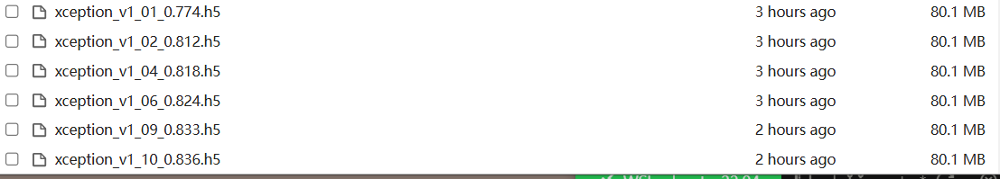  
我们只需要保留最佳模型，xception_v1_10_0.836.h5 ，其余模型都可以删除掉

# 8.8 Adding more layers
- Adding one inner dense layer                       添加一层内部密集层
- Experimenting with different sizes of inner layer   尝试不同尺寸的内层
- 如下图所示：
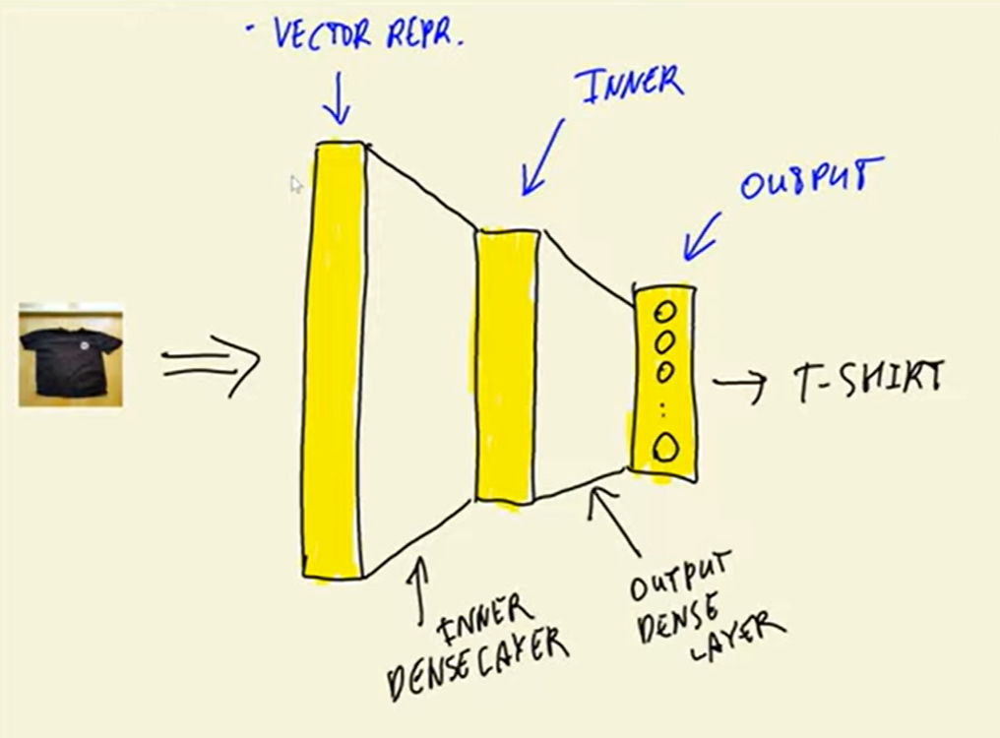

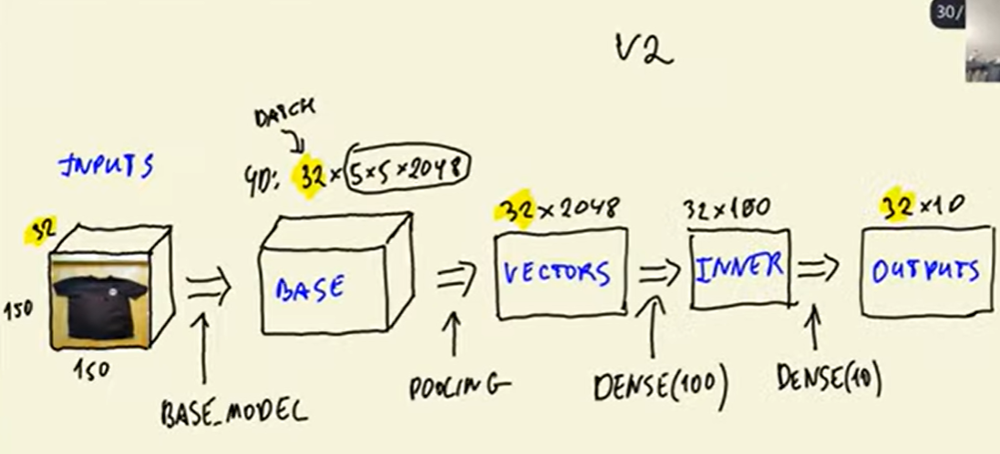

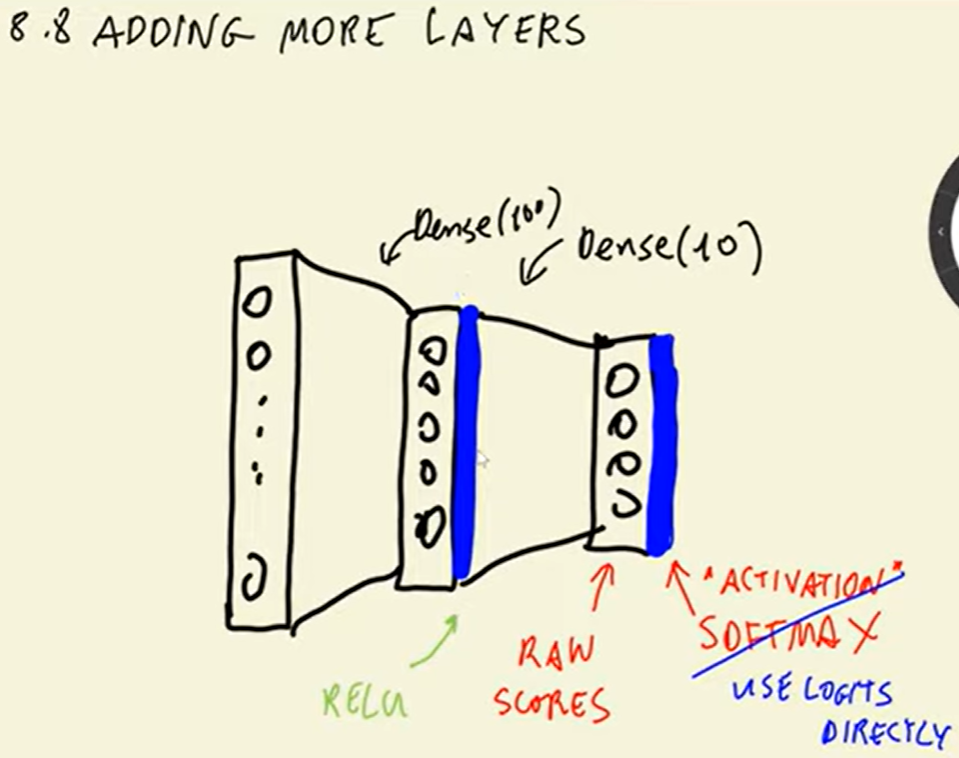
- 图中：SOFTMAX函数的功能，是将dense层的outputs，转换为概率值
- Softmax本身也是一种激活函数，但它几乎只用于多分类网络的输出层
- 图中：现在没有使用SOFTMAX，直接使用了LOGITS，这个函数是包含了SOFTMAX的
- 图中：inner层也有***激活函数***，叫做RELU。这个是神经网络默认的激活函数，建议使用。
- ReLU 是一个通用的激活函数，可以用在几乎所有需要引入非线性的层（卷积层或全连接层）之后。
- 激活函数（如ReLU、Sigmoid）像是“开关”或“滤镜”，负责决定“这个神经元要不要亮”以及“亮多少”。
- 如下图：我们学习到目前，已知的激活函数：
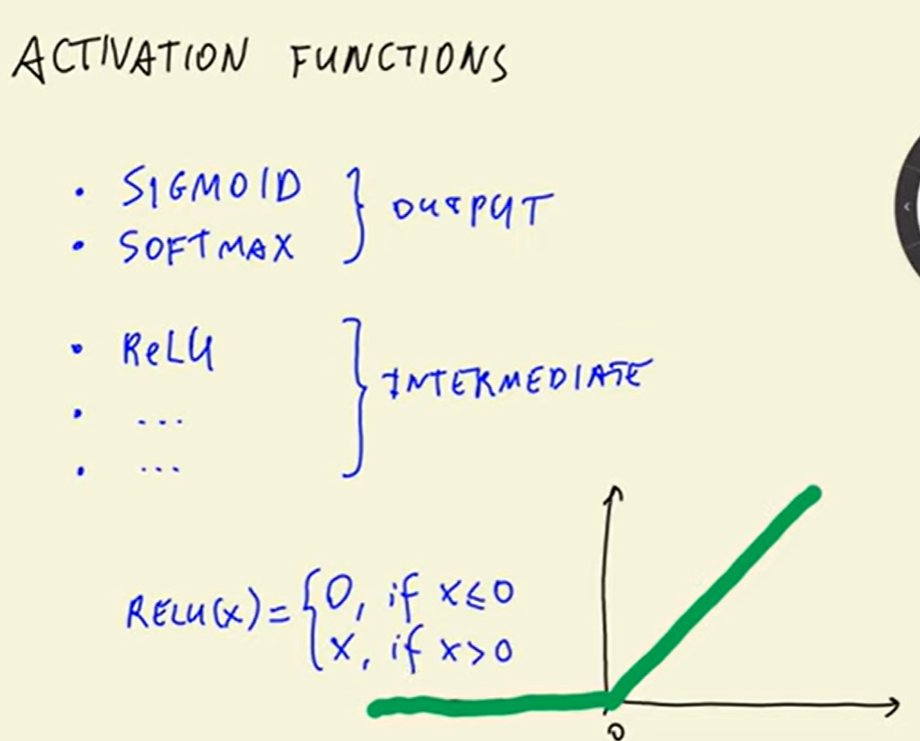

In [13]:
def make_model(learning_rate=0.01, size_inner=100):
    base_model = Xception(
        weights='imagenet',
        include_top=False,
        input_shape=(150, 150, 3)
    )

    base_model.trainable = False

    #########################################

    inputs = keras.Input(shape=(150, 150, 3))
    base = base_model(inputs, training=False)
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    
    inner = keras.layers.Dense(size_inner, activation='relu')(vectors) # 这个就是添加的密集层
    
    outputs = keras.layers.Dense(10)(inner)
    
    model = keras.Model(inputs, outputs)
    
    #########################################

    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    loss = keras.losses.CategoricalCrossentropy(from_logits=True)

    model.compile(
        optimizer=optimizer,
        loss=loss,
        metrics=['accuracy']
    )
    
    return model

In [47]:
learning_rate = 0.001

scores = {}

for size in [10, 100, 1000]:
    print(size)

    model = make_model(learning_rate=learning_rate, size_inner=size)
    history = model.fit(train_ds, epochs=10, validation_data=val_ds)
    scores0[size] = history.history

    print()
    print()

10
Epoch 1/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 189s 2s/step - accuracy: 0.5104 - loss: 1.3665 - val_accuracy: 0.6422 - val_loss: 1.0095
Epoch 2/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 186s 2s/step - accuracy: 0.6995 - loss: 0.8590 - val_accuracy: 0.7625 - val_loss: 0.7738
Epoch 3/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 188s 2s/step - accuracy: 0.7927 - loss: 0.6292 - val_accuracy: 0.7977 - val_loss: 0.6552
Epoch 4/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 184s 2s/step - accuracy: 0.8465 - loss: 0.4930 - val_accuracy: 0.8065 - val_loss: 0.5993
Epoch 5/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 183s 2s/step - accuracy: 0.8748 - loss: 0.4103 - val_accuracy: 0.8211 - val_loss: 0.5571
Epoch 6/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 181s 2s/step - accuracy: 0.8915 - loss: 0.3563 - val_accuracy: 0.8270 - val_loss: 0.5552
Epoch 7/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 206s 2s/step - accuracy: 0.9110 - loss: 0.3079 - val_accuracy: 0.8123 - val_loss: 0.5577
Epoch 8/10
96/96 ━━━━━━━━━━━━━━━━━━━━ 194s 2s/step - accuracy: 0.9293 - loss: 0.2701 - val_accuracy: 0.8358 

In [65]:
# 因为前后几节内容中的训练模型的结果变量名称score一样，还因为下一节在本节结果没有生成前，提前完成了计算，
#导致其结果给到了这一节，但运算结果还在，我手动赋值. 再训练一次太漫长了，没时间等了。不过我正在处理GPU的事情，会好的。
scores88 = {
    10: {
        'accuracy': [
            0.5104, 0.6995, 0.7927, 0.8465, 0.8748,
            0.8915, 0.9110, 0.9293, 0.9335, 0.9514
        ],
        'loss': [
            1.3665, 0.8590, 0.6292, 0.4930, 0.4103,
            0.3563, 0.3079, 0.2701, 0.2422, 0.2064
        ],
        'val_accuracy': [
            0.6422, 0.7625, 0.7977, 0.8065, 0.8211,
            0.8270, 0.8123, 0.8358, 0.8328, 0.8182
        ],
        'val_loss': [
            1.0095, 0.7738, 0.6552, 0.5993, 0.5571,
            0.5552, 0.5577, 0.5252, 0.5380, 0.5458
        ]
    },
    100: {
        'accuracy': [
            0.6581, 0.8204, 0.8833, 0.9254, 0.9531,
            0.9668, 0.9870, 0.9928, 0.9974, 0.9987
        ],
        'loss': [
            0.9951, 0.5128, 0.3624, 0.2465, 0.1789,
            0.1312, 0.0878, 0.0606, 0.0428, 0.0301
        ],
        'val_accuracy': [
            0.8065, 0.7947, 0.8211, 0.8240, 0.8240,
            0.8211, 0.8270, 0.8328, 0.8270, 0.8240
        ],
        'val_loss': [
            0.6040, 0.5870, 0.5345, 0.5351, 0.5286,
            0.5344, 0.5585, 0.5406, 0.5723, 0.5703
        ]
    },
    1000: {
        'accuracy': [
            0.6802, 0.8351, 0.9042, 0.9544, 0.9804,
            0.9964, 0.9984, 0.9984, 0.9993, 0.9997
        ],
        'loss': [
            0.9511, 0.4576, 0.2778, 0.1543, 0.0780,
            0.0385, 0.0222, 0.0152, 0.0131, 0.0067
        ],
        'val_accuracy': [
            0.7507, 0.8035, 0.8123, 0.8182, 0.8094,
            0.8270, 0.8182, 0.8299, 0.8240, 0.8270
        ],
        'val_loss': [
            0.6933, 0.6022, 0.6044, 0.6086, 0.6428,
            0.6627, 0.7078, 0.6717, 0.6930, 0.7011
        ]
    }
}

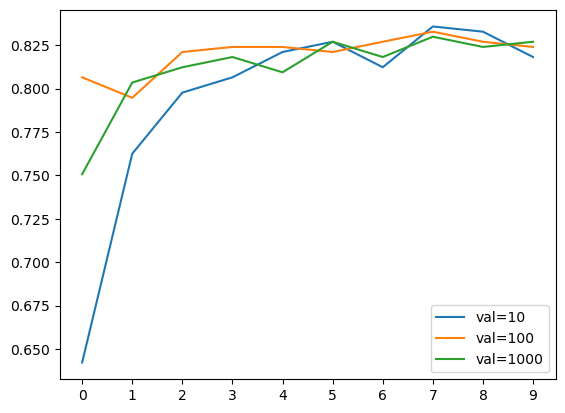

In [66]:
for size, hist in scores88.items():
    plt.plot(hist['val_accuracy'], label=('val=%s' % size))

plt.xticks(np.arange(10))
# plt.yticks([0.78, 0.80, 0.82, 0.825, 0.83])
plt.legend()


# 从图中我们看出来的：
- 10  和 100 的峰值接近，似乎两者都一样好
- 都在7 的时候，可以达到峰值附近
- 10个这 数量，是最后合理的，因为它让模型更轻便。
- 但是alexey老师选择了100，他的情况结果，我理解老师的意思就是：100 的话，val_accurary 的值能再更小的循环迭代轮次下取得更好的结果，而且随着轮次的深入，val_accurary结果波动不是很大。
- 如下图：
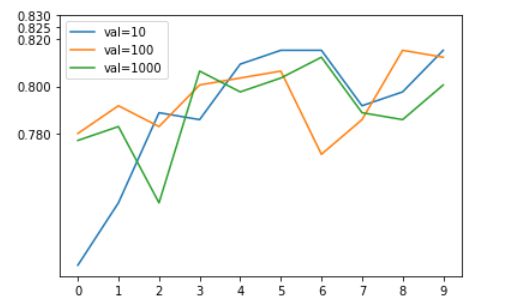

# 8.9 Regularization and dropout                         正则化与Dropout
- Regularizing by freezing a part of the network         通过冻结网络的一部分来实现正则化
- Adding dropout to our model                            在模型中添加Dropout
- Experimenting with different values                     尝试不同的数值

# 回顾一下训练的过程，先举个例子
- 本章中一开始，数据集中的那个Tshirt图片，胸口位置，是个log图案，如果我们采取遍历数据集10次，进行模型训练的方式，我们将会读取到10次这个图片。
- 如果在验证/测试阶段，如果神经网络看到这个log，它可能就会认为’好的，我已经见过这个logo了，所以一定是Tshirt',但这并不是我们想要的结果，我们希望神经网络更多地关注袖子、颜色等特征，而不是具体的图案。

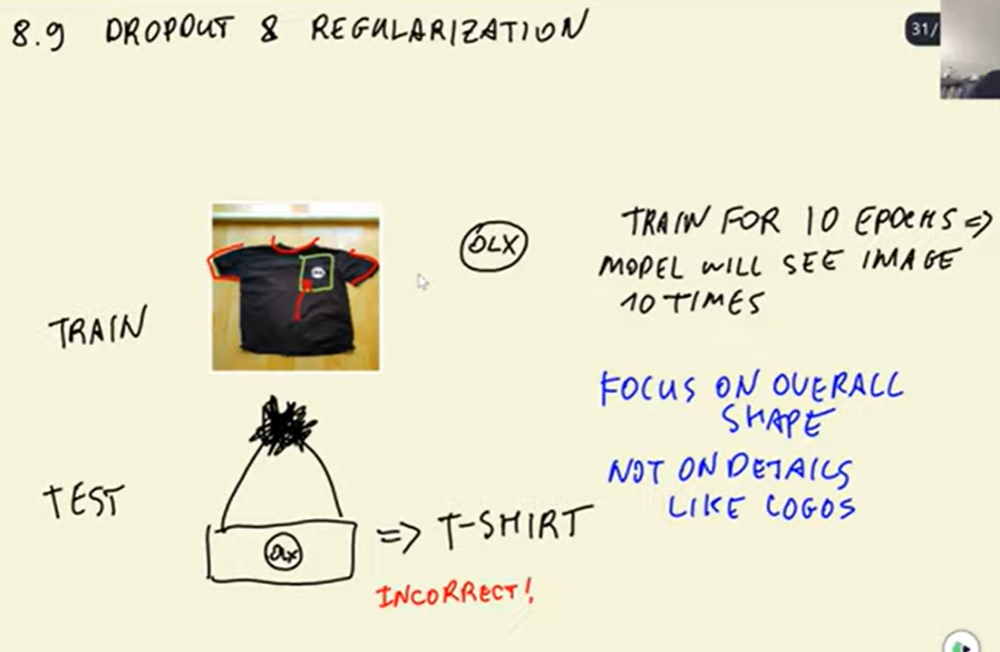

### 先考虑个问题，如果训练过程中，让模型看到图像之前，先隐藏一部分图像呢？
- 假设我们有1个黑色色块，并且这副图像被多次显示，显示次数与训练轮数相同。
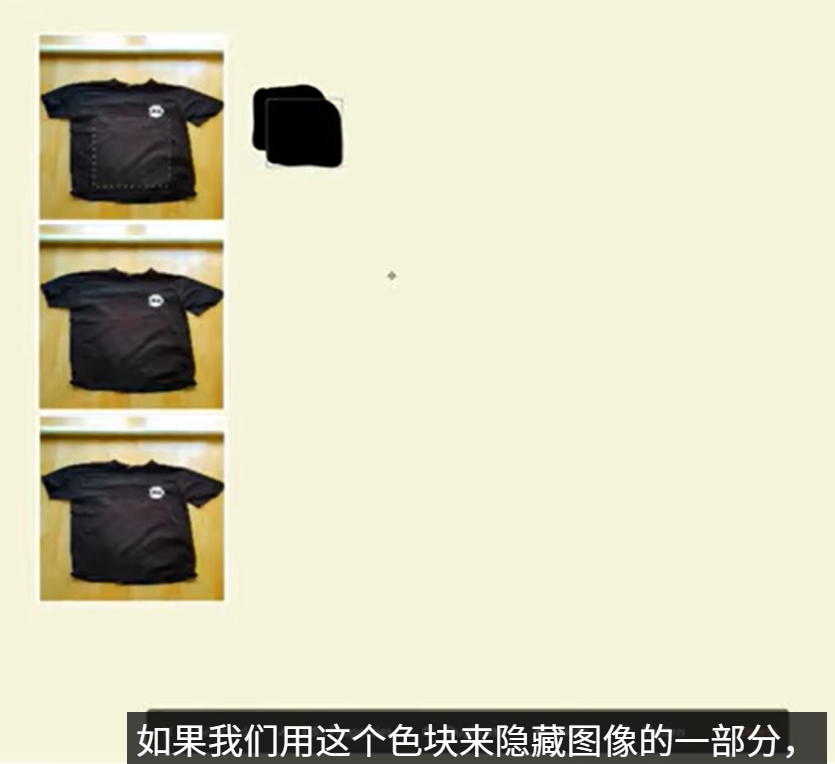

- 如果我们用这个色块来隐藏图像的一部分，模型看到图像时，就都是略有不同的版本。
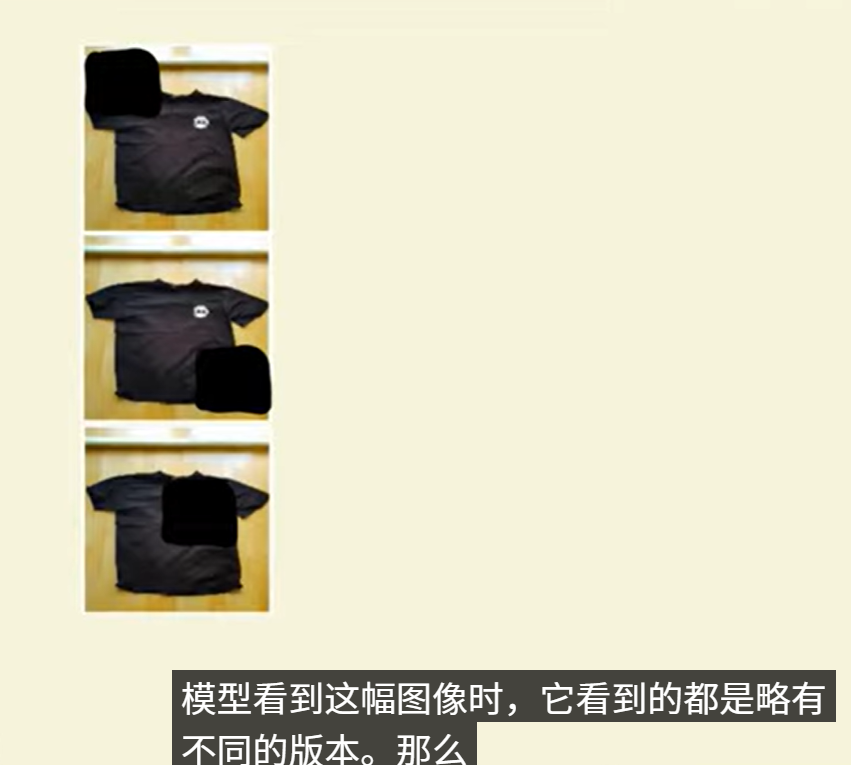

***以上，就是dropout的思想***

这个图表示，dropout的配置，要在inner层中完成
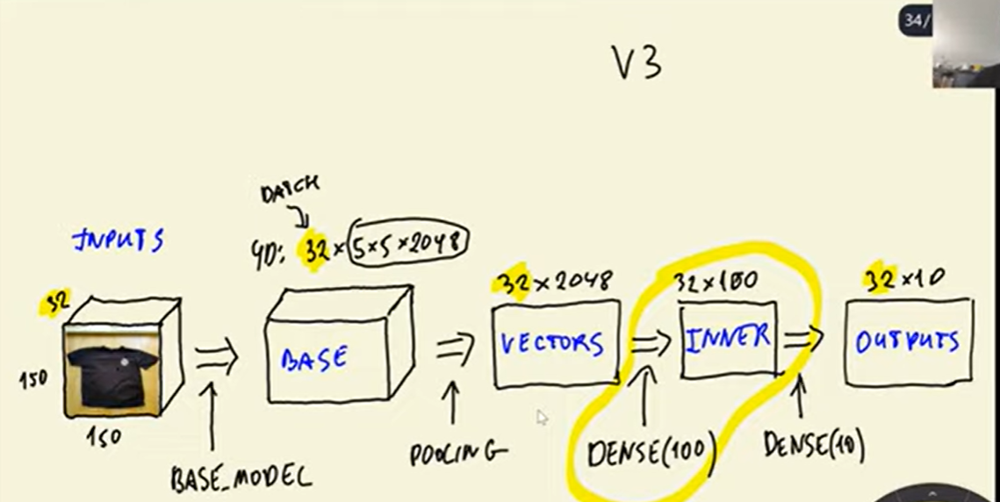


In [14]:
def make_model(learning_rate=0.01, size_inner=100, droprate=0.5):
    base_model = Xception(
        weights='imagenet',
        include_top=False,
        input_shape=(150, 150, 3)
    )

    base_model.trainable = False

    #########################################

    inputs = keras.Input(shape=(150, 150, 3))
    base = base_model(inputs, training=False)
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    
    inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
    drop = keras.layers.Dropout(droprate)(inner)
    
    outputs = keras.layers.Dense(10)(drop)
    
    model = keras.Model(inputs, outputs)
    
    #########################################

    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    loss = keras.losses.CategoricalCrossentropy(from_logits=True)

    model.compile(
        optimizer=optimizer,
        loss=loss,
        metrics=['accuracy']
    )
    
    return model

In [50]:
learning_rate = 0.001
size = 100

scores = {}

for droprate in [0.0, 0.2, 0.5, 0.8]:
    print(droprate)

    model = make_model(
        learning_rate=learning_rate,
        size_inner=size,
        droprate=droprate
    )

    history = model.fit(train_ds, epochs=30, validation_data=val_ds)
    scores[droprate] = history.history

    print()
    print()

0.0
Epoch 1/30
96/96 ━━━━━━━━━━━━━━━━━━━━ 137s 1s/step - accuracy: 0.6760 - loss: 0.9680 - val_accuracy: 0.7625 - val_loss: 0.6765
Epoch 2/30
96/96 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - accuracy: 0.8090 - loss: 0.5309 - val_accuracy: 0.7889 - val_loss: 0.6326
Epoch 3/30
96/96 ━━━━━━━━━━━━━━━━━━━━ 168s 2s/step - accuracy: 0.8752 - loss: 0.3664 - val_accuracy: 0.8065 - val_loss: 0.5680
Epoch 4/30
96/96 ━━━━━━━━━━━━━━━━━━━━ 176s 2s/step - accuracy: 0.9143 - loss: 0.2632 - val_accuracy: 0.8094 - val_loss: 0.5904
Epoch 5/30
96/96 ━━━━━━━━━━━━━━━━━━━━ 179s 2s/step - accuracy: 0.9456 - loss: 0.1903 - val_accuracy: 0.8182 - val_loss: 0.5603
Epoch 6/30
96/96 ━━━━━━━━━━━━━━━━━━━━ 194s 2s/step - accuracy: 0.9723 - loss: 0.1250 - val_accuracy: 0.8123 - val_loss: 0.5588
Epoch 7/30
96/96 ━━━━━━━━━━━━━━━━━━━━ 182s 2s/step - accuracy: 0.9860 - loss: 0.0843 - val_accuracy: 0.8152 - val_loss: 0.5878
Epoch 8/30
96/96 ━━━━━━━━━━━━━━━━━━━━ 183s 2s/step - accuracy: 0.9961 - loss: 0.0587 - val_accuracy: 0.8006

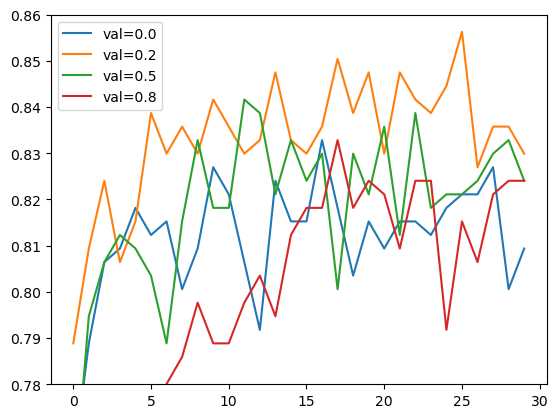

In [62]:
for droprate, hist in scores.items():
    plt.plot(hist['val_accuracy'], label=('val=%s' % droprate))

plt.ylim(0.78, 0.86)
plt.legend()

In [67]:
scores

{0.0: {'accuracy': [0.6760104298591614,
   0.8089960813522339,
   0.8751629590988159,
   0.9142764210700989,
   0.9455671310424805,
   0.9722946286201477,
   0.9859843254089355,
   0.9960886836051941,
   0.9986962080001831,
   0.9980443120002747,
   0.9986962080001831,
   0.9986962080001831,
   0.9993481040000916,
   0.9996740818023682,
   0.9996740818023682,
   0.9996740818023682,
   0.9993481040000916,
   0.9993481040000916,
   0.9990221858024597,
   0.9993481040000916,
   0.9970664978027344,
   0.9993481040000916,
   0.9996740818023682,
   0.9996740818023682,
   0.9993481040000916,
   0.9983702898025513,
   0.9990221858024597,
   0.9993481040000916,
   0.9996740818023682,
   0.9986962080001831],
  'loss': [0.9680436849594116,
   0.5308746099472046,
   0.36638230085372925,
   0.2631656527519226,
   0.19030368328094482,
   0.1250004917383194,
   0.08428895473480225,
   0.05871084704995155,
   0.04181467741727829,
   0.03379552811384201,
   0.025987422093749046,
   0.01895477995276451,

###   上面我们可以看到，
- 橙色的线，就是droprate是0.2的线，在25次训练的时候，形成了一个异常突起和降落，
- val_accuracy 接近了86%的最高值。

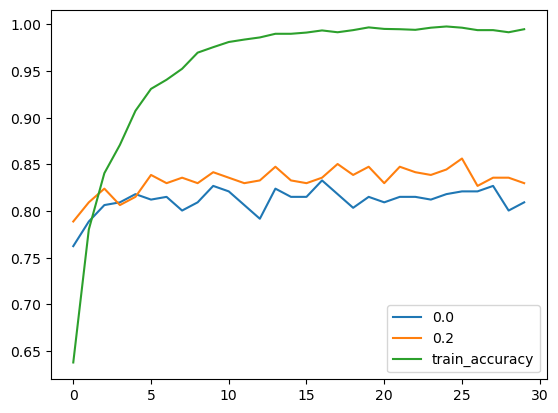

In [70]:
hist = scores[0.0]
plt.plot(hist['val_accuracy'], label=0.0)

hist = scores[0.2]
plt.plot(hist['val_accuracy'], label=0.2)
plt.plot(hist['accuracy'], label='train_accuracy')
plt.legend()
#plt.plot(hist['accuracy'], label=('val=%s' % droprate))

# 8.10 Data augmentation                             数据增强
- Different data augmentations                      不同的数据增强方法   
- Training a model with augmentations                使用增强技术训练模型  
- How to select data augmentations?                 如何选择数据增强方式？

- ***这是一种对抗过度拟合的方式***

In [19]:
# 注意：老师得github中，没有对图像处理/数据增强得内容描述，我从视频中扒出来得。
# 修改图像生成器,配置参数，让图片发生各种变化形态上得变化
train_gen3 = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    #rotation_range =  30,
    #width_shift_range = 10.0 ,
    #height_shift_range = 10.0 ,
    # brightness_range=None,
    shear_range = 10.0,
    zoom_range = 0.1,
    # channel_shift_range=0.0,
    # cval = 0.0,
    # horizontal_flip = False,
    vertical_flip=True,
)

In [20]:
train_ds3 = train_gen3.flow_from_directory(
    '../clothing-dataset-small/train',
    target_size=(150, 150),
    batch_size=16    # 调低，看看GPU的工作效率会不会提高，怕数据量太大，吃不过来。
)

# 验证数据集，保持不变，不做数据增强
val_gen3 = ImageDataGenerator(preprocessing_function=preprocess_input)

val_ds3 = val_gen3.flow_from_directory(
    '../clothing-dataset-small/validation',
    target_size=(150, 150),
    batch_size=16,
    shuffle=False
)


Found 3068 images belonging to 10 classes.
Found 341 images belonging to 10 classes.


In [21]:
learning_rate = 0.001
size = 100
droprate = 0.2

model = make_model(
    learning_rate=learning_rate,
    size_inner=size,
    droprate=droprate
)

history = model.fit(train_ds3, epochs=50, validation_data=val_ds3)

Epoch 1/50


I0000 00:00:1788442982.376946  249282 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_42516__.129


149/192 ━━━━━━━━━━━━━━━━━━━━ 16s 391ms/step - accuracy: 0.5721 - loss: 1.3248

I0000 00:00:1788443065.187121  249287 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_42516__.129


192/192 ━━━━━━━━━━━━━━━━━━━━ 160s 682ms/step - accuracy: 0.5939 - loss: 1.2664 - val_accuracy: 0.7243 - val_loss: 0.7777
Epoch 2/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 60s 312ms/step - accuracy: 0.6985 - loss: 0.8946 - val_accuracy: 0.7390 - val_loss: 0.7351
Epoch 3/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 59s 304ms/step - accuracy: 0.7386 - loss: 0.7729 - val_accuracy: 0.7713 - val_loss: 0.6988
Epoch 4/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 59s 306ms/step - accuracy: 0.7676 - loss: 0.6883 - val_accuracy: 0.7654 - val_loss: 0.6599
Epoch 5/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 82s 291ms/step - accuracy: 0.7793 - loss: 0.6386 - val_accuracy: 0.7713 - val_loss: 0.6929
Epoch 6/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 56s 293ms/step - accuracy: 0.7797 - loss: 0.6190 - val_accuracy: 0.7859 - val_loss: 0.6462
Epoch 7/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 82s 289ms/step - accuracy: 0.7986 - loss: 0.5723 - val_accuracy: 0.7771 - val_loss: 0.6415
Epoch 8/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 60s 312ms/step - accuracy: 0.8318 - loss: 0.5139 - va

In [14]:
# 手动填数据，不想重复计算了，计算机重启了
scores810 = {
        'accuracy': [
            0.5939, 0.6985, 0.7386, 0.7676, 0.7793,
            0.7797, 0.7986, 0.8318, 0.8393, 0.8367,
            0.8484, 0.8530, 0.8488, 0.8625, 0.8651,
            0.8791, 0.8836, 0.8794, 0.8853, 0.8928,
            0.8830, 0.8977, 0.9061, 0.9003, 0.9107,
            0.8967, 0.9051, 0.9100, 0.9104, 0.9136,
            0.9143, 0.9198, 0.9153, 0.9221, 0.9192,
            0.9289, 0.9228, 0.9276, 0.9381, 0.9293,
            0.9342, 0.9364, 0.9345, 0.9345, 0.9381,
            0.9338, 0.9387, 0.9361, 0.9404, 0.9410
        ],
        'loss': [
            1.2664, 0.8946, 0.7729, 0.6883, 0.6386,
            0.6190, 0.5723, 0.5139, 0.4822, 0.4732,
            0.4277, 0.4289, 0.4173, 0.3848, 0.3812,
            0.3588, 0.3340, 0.3475, 0.3105, 0.3039,
            0.3078, 0.2965, 0.2800, 0.2847, 0.2605,
            0.2891, 0.2727, 0.2634, 0.2478, 0.2359,
            0.2287, 0.2230, 0.2278, 0.2198, 0.2234,
            0.2118, 0.2121, 0.1943, 0.1897, 0.1998,
            0.1846, 0.1748, 0.1925, 0.1810, 0.1658,
            0.1907, 0.1650, 0.1822, 0.1758, 0.1639
        ],
        'val_accuracy': [
            0.7243, 0.7390, 0.7713, 0.7654, 0.7713,
            0.7859, 0.7771, 0.7830, 0.7830, 0.7771,
            0.8006, 0.7830, 0.7889, 0.7918, 0.7977,
            0.7683, 0.7918, 0.8065, 0.7889, 0.8065,
            0.8065, 0.8065, 0.7771, 0.7918, 0.7947,
            0.8152, 0.8035, 0.7918, 0.7947, 0.8094,
            0.8094, 0.8065, 0.7947, 0.7889, 0.7889,
            0.7947, 0.8035, 0.8152, 0.8152, 0.7977,
            0.7859, 0.7889, 0.8123, 0.8094, 0.8006,
            0.7918, 0.7947, 0.8065, 0.7889, 0.7625
        ],
        'val_loss': [
            0.7777, 0.7351, 0.6988, 0.6599, 0.6929,
            0.6462, 0.6415, 0.6366, 0.6637, 0.6450,
            0.5875, 0.6440, 0.6067, 0.6769, 0.6358,
            0.6814, 0.7174, 0.5931, 0.6597, 0.6487,
            0.6325, 0.6677, 0.7075, 0.6850, 0.6351,
            0.7127, 0.6798, 0.7363, 0.6791, 0.6897,
            0.7110, 0.6931, 0.7731, 0.7583, 0.7563,
            0.8306, 0.7288, 0.7156, 0.6525, 0.7759,
            0.7239, 0.6839, 0.7215, 0.7852, 0.7529,
            0.7273, 0.7621, 0.6945, 0.8669, 0.8272
        ]
}

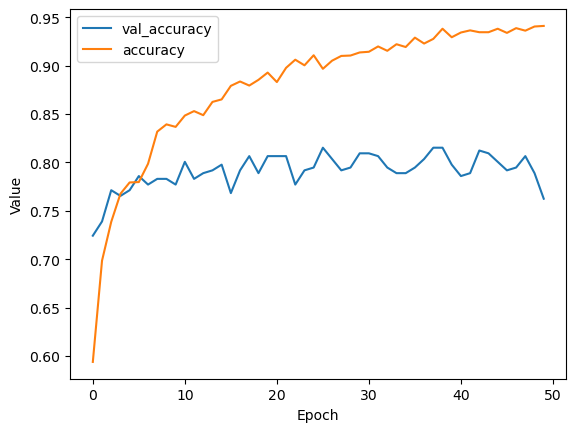

In [16]:
# hist3 = history.history
#plt.plot(hist3['val_accuracy'], label='val')
#plt.plot(hist3['accuracy'], label='train')

plt.plot(scores810['val_accuracy'], label='val_accuracy')
plt.plot(scores810['accuracy'], label='accuracy')

plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()

### 上述图标，发现：结果比之前要差，说明对数据的增强应该是不合理的，老师自己也搞不明白问题出在哪里了。 
- 通过多次修改增强参数，验证数据集的准确率 一直低于前面的情况，我看alexey的视频中是这样的，所以我就不测试了，转述一下情况。
- 算是对‘数据增强，做个总结’

###  CPU 和 GPU  工作逻辑
一开始的，数据生成和数据增强，由CPU 负责；
GPU负责训练模型，并将最终结果回传给CPU
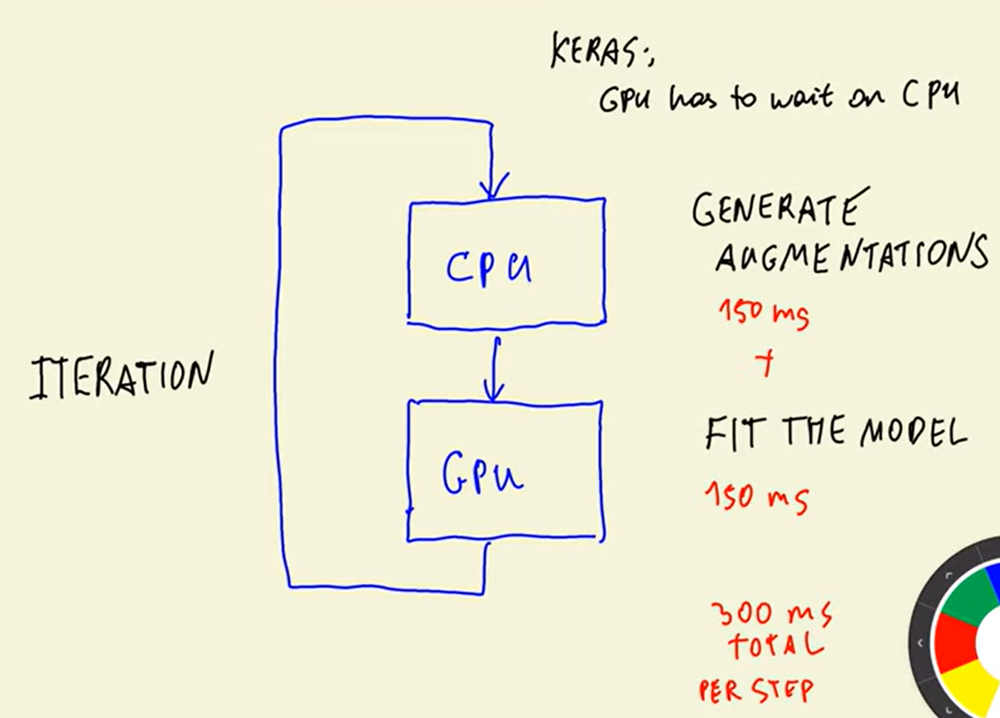


### 把增强功能去掉，我们再训练一下

In [9]:
train_gen2 = ImageDataGenerator(
    preprocessing_function=preprocess_input,
#     vertical_flip=True,
)

train_ds2 = train_gen2.flow_from_directory(
    '../clothing-dataset-small/train',
    target_size=(150, 150),
    batch_size=32
)

val_gen2 = ImageDataGenerator(preprocessing_function=preprocess_input)

val_ds2 = val_gen2.flow_from_directory(
    '../clothing-dataset-small/validation',
    target_size=(150, 150),
    batch_size=32,
    shuffle=False
)

Found 3068 images belonging to 10 classes.
Found 341 images belonging to 10 classes.


In [15]:
learning_rate = 0.001
size = 100
droprate = 0.2

model = make_model(
    learning_rate=learning_rate,
    size_inner=size,
    droprate=droprate
)

history = model.fit(train_ds2, epochs=50, validation_data=val_ds2)

Epoch 1/50


I0000 00:00:1788433199.097911  248655 generator_dataset_op.cc:213] Memory patch applied: M_TRIM_THRESHOLD=128 kb was set.
I0000 00:00:1788433203.918433  249282 service.cc:153] XLA service 0x70149c032780 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1788433203.918474  249282 service.cc:161]   StreamExecutor [0]: NVIDIA GeForce MX570, Compute Capability 8.6 (Driver: 13.2.0; Runtime: 12.9.0; Toolkit: 12.5.0; DNN: 9.25.1)
I0000 00:00:1788433204.063503  249282 dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1788433205.597129  249282 cuda_dnn.cc:461] Loaded cuDNN version 92501
I0000 00:00:1788433205.701778  249282 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_10040__.129
I0000 00:00:1788433234.596042  249282 device_compiler.h:208] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


70/96 ━━━━━━━━━━━━━━━━━━━━ 11s 425ms/step - accuracy: 0.6125 - loss: 1.1339

I0000 00:00:1788433267.504195  249287 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_10040__.129


96/96 ━━━━━━━━━━━━━━━━━━━━ 139s 1s/step - accuracy: 0.6460 - loss: 1.0471 - val_accuracy: 0.7977 - val_loss: 0.6571
Epoch 2/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 46s 476ms/step - accuracy: 0.7894 - loss: 0.6119 - val_accuracy: 0.8152 - val_loss: 0.6030
Epoch 3/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 43s 444ms/step - accuracy: 0.8380 - loss: 0.4731 - val_accuracy: 0.8270 - val_loss: 0.5475
Epoch 4/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 425ms/step - accuracy: 0.8726 - loss: 0.3617 - val_accuracy: 0.8416 - val_loss: 0.5272
Epoch 5/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 39s 402ms/step - accuracy: 0.9068 - loss: 0.2902 - val_accuracy: 0.8094 - val_loss: 0.5433
Epoch 6/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 43s 449ms/step - accuracy: 0.9286 - loss: 0.2268 - val_accuracy: 0.8328 - val_loss: 0.5244
Epoch 7/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 55s 567ms/step - accuracy: 0.9410 - loss: 0.1902 - val_accuracy: 0.8328 - val_loss: 0.5485
Epoch 8/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 58s 601ms/step - accuracy: 0.9612 - loss: 0.1421 - val_accuracy: 0.8416 

In [17]:
scores8102 = {
        'accuracy': [
            0.6460, 0.7894, 0.8380, 0.8726, 0.9068,
            0.9286, 0.9410, 0.9612, 0.9707, 0.9775,
            0.9808, 0.9860, 0.9873, 0.9912, 0.9922,
            0.9925, 0.9932, 0.9941, 0.9919, 0.9961,
            0.9977, 0.9958, 0.9951, 0.9951, 0.9948,
            0.9977, 0.9945, 0.9941, 0.9951, 0.9892,
            0.9886, 0.9928, 0.9935, 0.9974, 0.9948,
            0.9915, 0.9948, 0.9958, 0.9967, 0.9935,
            0.9896, 0.9945, 0.9905, 0.9935, 0.9948,
            0.9954, 0.9987, 0.9974, 0.9964, 0.9879
        ],
        'loss': [
            1.0471, 0.6119, 0.4731, 0.3617, 0.2902,
            0.2268, 0.1902, 0.1421, 0.1155, 0.0973,
            0.0800, 0.0674, 0.0574, 0.0520, 0.0449,
            0.0372, 0.0343, 0.0336, 0.0368, 0.0266,
            0.0235, 0.0214, 0.0244, 0.0206, 0.0253,
            0.0165, 0.0281, 0.0224, 0.0208, 0.0352,
            0.0407, 0.0265, 0.0215, 0.0164, 0.0181,
            0.0319, 0.0181, 0.0159, 0.0148, 0.0226,
            0.0306, 0.0170, 0.0258, 0.0222, 0.0174,
            0.0183, 0.0087, 0.0091, 0.0151, 0.0346
        ],
        'val_accuracy': [
            0.7977, 0.8152, 0.8270, 0.8416, 0.8094,
            0.8328, 0.8328, 0.8416, 0.8240, 0.8299,
            0.8387, 0.8328, 0.8358, 0.8358, 0.8328,
            0.8358, 0.8416, 0.8358, 0.8270, 0.8270,
            0.8240, 0.8152, 0.8328, 0.8358, 0.8416,
            0.8387, 0.8182, 0.8387, 0.8534, 0.8504,
            0.8270, 0.8123, 0.8475, 0.8328, 0.8270,
            0.8299, 0.8358, 0.8299, 0.8270, 0.8123,
            0.8299, 0.8328, 0.8152, 0.8152, 0.8358,
            0.8240, 0.8123, 0.8416, 0.8270, 0.8152
        ],
        'val_loss': [
            0.6571, 0.6030, 0.5475, 0.5272, 0.5433,
            0.5244, 0.5485, 0.5376, 0.5693, 0.5551,
            0.5529, 0.5887, 0.5728, 0.5922, 0.5963,
            0.6005, 0.5954, 0.6418, 0.6593, 0.6483,
            0.6635, 0.6986, 0.6827, 0.6852, 0.6589,
            0.7151, 0.7172, 0.7375, 0.7356, 0.7481,
            0.7489, 0.7384, 0.7608, 0.7477, 0.7710,
            0.7460, 0.7817, 0.7886, 0.8796, 0.9821,
            0.8652, 0.8735, 0.7978, 0.8474, 0.7712,
            0.9058, 0.9495, 0.8477, 0.8525, 0.9924
        ]
}

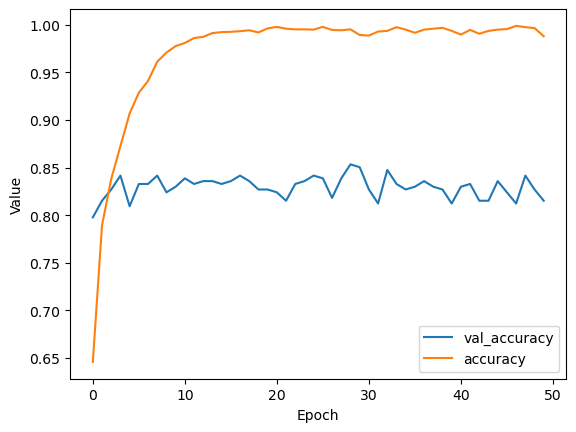

In [18]:
#hist = history.history
#plt.plot(hist['val_accuracy'], label='val')
#plt.plot(hist['accuracy'], label='train')

#plt.legend()

plt.plot(scores8102['val_accuracy'], label='val_accuracy')
plt.plot(scores8102['accuracy'], label='accuracy')

plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()


### 可以看到这次的情况是，模型准确率达到了85%，在迭代30次左右的时候

# 8.11 Training a larger model
Train a 299x299 model

In [6]:
def make_model811(input_size=150, learning_rate=0.01, size_inner=100,
               droprate=0.5):

    base_model = Xception(
        weights='imagenet',
        include_top=False,
        input_shape=(input_size, input_size, 3)
    )

    base_model.trainable = False

    #########################################

    inputs = keras.Input(shape=(input_size, input_size, 3))
    base = base_model(inputs, training=False)
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    
    inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
    drop = keras.layers.Dropout(droprate)(inner)
    
    outputs = keras.layers.Dense(10)(drop)
    
    model = keras.Model(inputs, outputs)
    
    #########################################

    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    loss = keras.losses.CategoricalCrossentropy(from_logits=True)

    model.compile(
        optimizer=optimizer,
        loss=loss,
        metrics=['accuracy']
    )
    
    return model

In [7]:
input_size = 299

In [12]:
# 关闭 XLA（减少 CPU 开销）
#import os
#os.environ['TF_ENABLE_XLA'] = '0'

# 混合精度训练（FP16）  MX570 支持 FP16，可以让计算更快，从而提升利用率
#from tensorflow.keras.mixed_precision import set_global_policy
#set_global_policy('mixed_float16')

# 配置增强参数
train_gen4 = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    shear_range=10,
    zoom_range=0.1,
    horizontal_flip=True
)

train_ds4 = train_gen4.flow_from_directory(
    '../clothing-dataset-small/train',
    target_size=(input_size, input_size),
    batch_size=4
)

# 用 from_generator 但限制 prefetch 为 1，提高GPU使用率
#train_ds4 = tf.data.Dataset.from_generator(
#    lambda: train_ds4_raw,
#    output_signature=(
#        tf.TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32),
#        tf.TensorSpec(shape=(None, 10), dtype=tf.float32)
#    )
#).prefetch(1)  # 用 1 而不是 AUTOTUNE


val_gen4 = ImageDataGenerator(preprocessing_function=preprocess_input)

val_ds4 = val_gen4.flow_from_directory(
    '../clothing-dataset-small/validation',
    target_size=(input_size, input_size),
    batch_size=4,
    shuffle=False
)

Found 3068 images belonging to 10 classes.
Found 341 images belonging to 10 classes.


In [13]:
checkpoint = keras.callbacks.ModelCheckpoint(
    'xception_v4_1_{epoch:02d}_{val_accuracy:.3f}.h5',
    save_best_only=True,
    monitor='val_accuracy',
    mode='max'
)

In [14]:
learning_rate = 0.0005
size = 100
droprate = 0.2


model = make_model811(
    input_size=input_size,
    learning_rate=learning_rate,
    size_inner=size,
    droprate=droprate
)

history = model.fit(train_ds4, epochs=50, validation_data=val_ds4,
                   callbacks=[checkpoint])

Epoch 1/50


I0000 00:00:1788519769.280133    2348 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_19953__.129


767/767 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - accuracy: 0.7500 - loss: 0.7458

767/767 ━━━━━━━━━━━━━━━━━━━━ 170s 208ms/step - accuracy: 0.7500 - loss: 0.7458 - val_accuracy: 0.8680 - val_loss: 0.4265
Epoch 2/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 138s 179ms/step - accuracy: 0.8419 - loss: 0.4380 - val_accuracy: 0.8328 - val_loss: 0.4441
Epoch 3/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 145s 189ms/step - accuracy: 0.8742 - loss: 0.3700 - val_accuracy: 0.8680 - val_loss: 0.3962
Epoch 4/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 140s 182ms/step - accuracy: 0.8872 - loss: 0.3194 - val_accuracy: 0.8651 - val_loss: 0.3694
Epoch 5/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 143s 186ms/step - accuracy: 0.9029 - loss: 0.2813 - val_accuracy: 0.8592 - val_loss: 0.3820
Epoch 6/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - accuracy: 0.9094 - loss: 0.2655

767/767 ━━━━━━━━━━━━━━━━━━━━ 141s 184ms/step - accuracy: 0.9094 - loss: 0.2655 - val_accuracy: 0.8768 - val_loss: 0.3689
Epoch 7/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 140s 182ms/step - accuracy: 0.9104 - loss: 0.2471 - val_accuracy: 0.8768 - val_loss: 0.3715
Epoch 8/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 121s 158ms/step - accuracy: 0.9237 - loss: 0.2234 - val_accuracy: 0.8680 - val_loss: 0.3858
Epoch 9/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 125s 163ms/step - accuracy: 0.9319 - loss: 0.1986 - val_accuracy: 0.8710 - val_loss: 0.3978
Epoch 10/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 117s 153ms/step - accuracy: 0.9338 - loss: 0.1863 - val_accuracy: 0.8563 - val_loss: 0.4090
Epoch 11/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 119s 155ms/step - accuracy: 0.9377 - loss: 0.1770 - val_accuracy: 0.8739 - val_loss: 0.3947
Epoch 12/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 119s 155ms/step - accuracy: 0.9381 - loss: 0.1672 - val_accuracy: 0.8563 - val_loss: 0.4544
Epoch 13/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 118s 154ms/step - accuracy: 0.9511 - loss: 

767/767 ━━━━━━━━━━━━━━━━━━━━ 118s 154ms/step - accuracy: 0.9596 - loss: 0.1085 - val_accuracy: 0.8856 - val_loss: 0.4541
Epoch 19/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 117s 152ms/step - accuracy: 0.9602 - loss: 0.1069 - val_accuracy: 0.8680 - val_loss: 0.4828
Epoch 20/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 115s 150ms/step - accuracy: 0.9664 - loss: 0.0979 - val_accuracy: 0.8622 - val_loss: 0.4537
Epoch 21/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 119s 156ms/step - accuracy: 0.9729 - loss: 0.0803 - val_accuracy: 0.8592 - val_loss: 0.5198
Epoch 22/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - accuracy: 0.9778 - loss: 0.0706

767/767 ━━━━━━━━━━━━━━━━━━━━ 120s 156ms/step - accuracy: 0.9778 - loss: 0.0706 - val_accuracy: 0.8886 - val_loss: 0.4823
Epoch 23/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 116s 152ms/step - accuracy: 0.9720 - loss: 0.0809 - val_accuracy: 0.8768 - val_loss: 0.5439
Epoch 24/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 116s 152ms/step - accuracy: 0.9713 - loss: 0.0741 - val_accuracy: 0.8856 - val_loss: 0.5255
Epoch 25/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 118s 154ms/step - accuracy: 0.9746 - loss: 0.0741 - val_accuracy: 0.8827 - val_loss: 0.4778
Epoch 26/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 113s 148ms/step - accuracy: 0.9743 - loss: 0.0784 - val_accuracy: 0.8416 - val_loss: 0.5429
Epoch 27/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 116s 151ms/step - accuracy: 0.9739 - loss: 0.0746 - val_accuracy: 0.8622 - val_loss: 0.5152
Epoch 28/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 116s 151ms/step - accuracy: 0.9808 - loss: 0.0631 - val_accuracy: 0.8827 - val_loss: 0.5121
Epoch 29/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 117s 152ms/step - accuracy: 0.9720 - los

767/767 ━━━━━━━━━━━━━━━━━━━━ 123s 160ms/step - accuracy: 0.9831 - loss: 0.0481 - val_accuracy: 0.8915 - val_loss: 0.5201
Epoch 46/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 121s 158ms/step - accuracy: 0.9791 - loss: 0.0566 - val_accuracy: 0.8856 - val_loss: 0.5139
Epoch 47/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 123s 160ms/step - accuracy: 0.9834 - loss: 0.0421 - val_accuracy: 0.8856 - val_loss: 0.6789
Epoch 48/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 121s 158ms/step - accuracy: 0.9860 - loss: 0.0432 - val_accuracy: 0.8768 - val_loss: 0.6507
Epoch 49/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 128s 166ms/step - accuracy: 0.9860 - loss: 0.0414 - val_accuracy: 0.8739 - val_loss: 0.6549
Epoch 50/50
767/767 ━━━━━━━━━━━━━━━━━━━━ 120s 157ms/step - accuracy: 0.9876 - loss: 0.0361 - val_accuracy: 0.8827 - val_loss: 0.6197


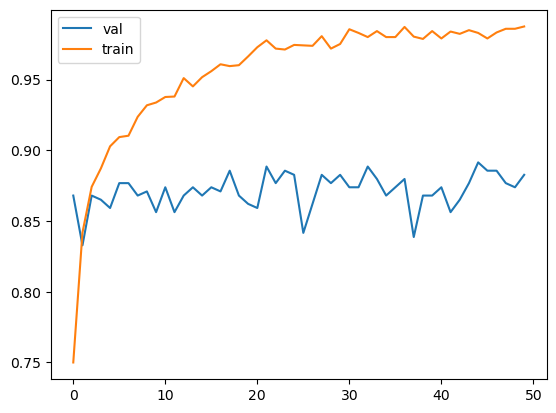

In [15]:
hist = history.history
plt.plot(hist['val_accuracy'], label='val')
plt.plot(hist['accuracy'], label='train')

plt.legend()

In [ ]:
# 我们保留 最优秀的模型，删除掉差的模型，本节课程结束了，欢迎大家来到神经网络的世界
- 我得出了最佳模型，在第45次迭代的时候：val_accuracy: 0.8915

# 8.12 Using the model
- Loading the model
- Evaluating the model
- Getting predictions

In [2]:
import tensorflow as tf
from tensorflow import keras

In [5]:
model_last = keras.models.load_model('xception_v4_1_45_0.891.h5')

I0000 00:00:1788528331.577381   72083 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1351 MB memory:  -> device: 0, name: NVIDIA GeForce MX570, pci bus id: 0000:02:00.0, compute capability: 8.6


In [6]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.applications.xception import preprocess_input  

In [9]:
test_gen_last = ImageDataGenerator( preprocessing_function=preprocess_input)  

test_ds = test_gen_last.flow_from_directory(
    '../clothing-dataset-small/test',
    target_size = (299,299),
    batch_size = 4,
    shuffle=False
)

Found 372 images belonging to 10 classes.


In [11]:
model_last.evaluate(test_ds)

I0000 00:00:1788528563.715675   72083 generator_dataset_op.cc:213] Memory patch applied: M_TRIM_THRESHOLD=128 kb was set.
I0000 00:00:1788528567.413505   78692 service.cc:153] XLA service 0x71d5480350f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1788528567.413553   78692 service.cc:161]   StreamExecutor [0]: NVIDIA GeForce MX570, Compute Capability 8.6 (Driver: 13.2.0; Runtime: 12.6.0; Toolkit: 12.5.0; DNN: 9.25.1)
I0000 00:00:1788528567.524838   78692 dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1788528568.495224   78692 cuda_dnn.cc:461] Loaded cuDNN version 92501
I0000 00:00:1788528591.925139   78692 device_compiler.h:208] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


93/93 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - accuracy: 0.8871 - loss: 0.4086


[0.4085538983345032, 0.8870967626571655]

### 总结一下下
93步，完成测试；372 / 93 = 4 (batch_size)
- loss: 0.4086   损失值，越低越好
- accuracy: 0.8871   准确度，88.71%
- 模型泛化能力很好，验证集最佳准确率：89.1%（训练时）
- 测试集准确率：88.71%
- 两者非常接近（只差 0.4%），说明模型没有过拟合，在未见过的数据上表现稳定。

In [ ]:
# 测试单个图片 
path = '../clothing-dataset-small/test/pants/15a1e02b-ad2a-4b9f-9d44-0e4d260594a8.jpg' 

In [ ]:
from tensorflow.keras.preprocessing.image import load_img 

In [20]:
img_last = load_img(path,target_size = (299,299))

In [23]:
import numpy as np

In [24]:
x_last = np.array(img_last)

In [28]:
X_last = np.array([x_last])

In [29]:
X_last.shape

(1, 299, 299, 3)

In [30]:
X_last = preprocess_input(X_last)

In [31]:
pred = model_last.predict(X_last)

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step


In [35]:
pred[0]

array([ -0.47377864, -14.1071415 ,  -6.6320066 ,  -8.9244585 ,
        12.71025   ,  -3.0698037 ,  -8.024976  ,   1.5428455 ,
       -11.129196  ,  -6.82832   ], dtype=float32)

In [33]:
classes = ['dress',
 'hat',
 'longsleeve',
 'outwear',
 'pants',
 'shirt',
 'shoes',
 'shorts',
 'skirt',
 't-shirt']

In [36]:
dict(zip(classes,pred[0]))

{'dress': np.float32(-0.47377864),
 'hat': np.float32(-14.1071415),
 'longsleeve': np.float32(-6.6320066),
 'outwear': np.float32(-8.9244585),
 'pants': np.float32(12.71025),
 'shirt': np.float32(-3.0698037),
 'shoes': np.float32(-8.024976),
 'shorts': np.float32(1.5428455),
 'skirt': np.float32(-11.129196),
 't-shirt': np.float32(-6.82832)}

In [ ]:
# 结果：'pants': np.float32(12.71025),  可以理解12.7是概率，这个值真的很高，远远高于其他值

# 8.13 Summary
- We can use pre-trained models for general image classification
- Convolutional layers let us turn an image into a vector
- Dense layers use the vector to make the predictions
- Instead of training a model from scratch, we can use transfer learning and re-use already trained convolutional lavers

# 8.14 Explore more
## 这是我认为alexey说的比较重要的事情，我们一定是要学习的
## Use ***PyTorch*** or MXNet instead of TensorFlow/Keras
## 其他可以使用的模型
如果你想追求更高的精度：可以尝试 ResNet 或 DenseNet。但要特别注意，它们的参数量可能很大，需搭配更小的 batch_size，这会拉长训练时间。

如果你想提升训练速度：MobileNet 系列是首选，它足够轻量，能在你的 GPU 上用更大的 batch_size，从而加快训练。之前的轻量化研究也常用 MobileNetV2 来替代 Xception。

如果你想兼顾不错的精度和效率：可以探索 EfficientNet 或 ShuffleNet。尤其是 ShuffleNetV2，在不少测试中都展现出很好的精度-效率平衡。